**INDR422 PROJECT BY BERKE KARAMANLI & ÖMER TATLICI**

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.formula.api as smf
from bbplot import bijan
import itertools
import warnings
from sklearn import neighbors
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.discriminant_analysis import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error
from gurobipy import *
import keras.models
from keras.models import Sequential
from keras.layers import Activation, Dense

Creating the Dataset as **masterdf**

In [3]:
#temperature predictors
df1 = pd.read_excel("Istanbul 1.xlsx")
df2 = pd.read_excel("Istanbul 2.xlsx")
df3 = pd.read_excel("Istanbul 3.xlsx", usecols=["datetime", "temp"])
df4 = pd.read_excel("Istanbul 4.xlsx")
df5 = pd.read_excel("Istanbul 5.xlsx")
df6 = pd.read_excel("Istanbul 6.xlsx")

#water consumption data to be forecasted
df_data = pd.read_excel("Istanbul Water Consumption and Dam Increases.xlsx")
df_data = df_data.iloc[:4748]
df_data.rename(columns={'Tarih': 'datetime'}, inplace=True)
df_data['datetime'] = pd.to_datetime(df_data['datetime'])
df_data.set_index("datetime",inplace=True)
df_data.drop('Unnamed: 11', axis=1, inplace=True)

#predictor showing if it rained or not based on dam increases
rain_columns = ['Ömerli', 'Darlik', 'Elmali', 'Terkos', 'B.çekmece', 'Sazlidere', 'Alibey', 'Kazandere', 'Pabuçdere', 'ıstırancalar']
df_data['rain'] = df_data[rain_columns].apply(lambda row: 0 if (row == 0).all() else 1, axis=1)

#population predictor
df_population = pd.read_excel("Yearly Istanbul Population.xls")
df_population = df_population.iloc[4:,::2]
df_population.rename(columns={'Unnamed: 0': 'Year', "Sütunlar": "popul"}, inplace=True)
df_population['Year'] = df_population['Year'].astype(int)
df_population['popul'] = df_population['popul'].astype(int)

#final dataframe that we will work on
masterdf = pd.concat([df1, df2, df3, df4, df5, df6], ignore_index=True)
masterdf['datetime'] = pd.to_datetime(masterdf['datetime'])
masterdf.set_index("datetime", inplace=True)
masterdf.sort_index(inplace=True)

#consumption, temperature, rain
masterdf = pd.concat([masterdf, df_data[["İstanbul günlük tüketim(m³/gün)"]], df_data["rain"]], axis=1)
masterdf.rename(columns={"İstanbul günlük tüketim(m³/gün)":"consumption"}, inplace=True)

#population
masterdf['Year'] = masterdf.index.year
masterdf.reset_index(inplace=True)
masterdf = masterdf.merge(df_population, on='Year', how='left')
masterdf.set_index("datetime", inplace=True)
masterdf.sort_index(inplace=True)

#yearly trend and daily & monthly dummies
masterdf['YearTrend'] = masterdf['Year'] - masterdf['Year'].min() + 1
masterdf['DayOfWeek'] = masterdf.index.dayofweek
day_dummies = pd.get_dummies(masterdf['DayOfWeek'], prefix='', drop_first=True).astype(int)
day_dummies.columns = ['Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
masterdf = pd.concat([masterdf, day_dummies], axis=1)
masterdf['Month'] = masterdf.index.month
month_dummies = pd.get_dummies(masterdf['Month'], prefix='', drop_first=True).astype(int)
month_names = ['February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
month_dummies.columns = month_names
masterdf = pd.concat([masterdf, month_dummies], axis=1)
masterdf.drop(columns=['Year', 'DayOfWeek', 'Month'], inplace=True)

columns = masterdf.columns.tolist()
temp_index = columns.index('temp')
cons_index = columns.index('consumption')
columns[temp_index], columns[cons_index] = columns[cons_index], columns[temp_index]
masterdf = masterdf[columns]

#lag of 1 day and 365 days 
masterdf["lag_1"] = masterdf['consumption'].shift(1).fillna(0).astype(int)
masterdf["lag_7"] = masterdf['consumption'].shift(7).fillna(0).astype(int)
masterdf["lag_365"] = masterdf['consumption'].shift(365).fillna(0).astype(int)

train_set = masterdf.loc["2011-01-01":"2020-12-31"]
test_set = masterdf.loc['2021-01-01':'2023-12-31']

masterdf

c:\Users\lenovo\anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
c:\Users\lenovo\anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
c:\Users\lenovo\anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
c:\Users\lenovo\anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
c:\Users\lenovo\anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook con

,consumption,temp,rain,popul,YearTrend,Tuesday,Wednesday,Thursday,Friday,Saturday,...,June,July,August,September,October,November,December,lag_1,lag_7,lag_365
datetime,,,,,,,,,,,,,,,,,,,,,
2011-01-01,2096199,4.0,0,13483052,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2011-01-02,2214668,8.0,1,13483052,1,0,0,0,0,0,...,0,0,0,0,0,0,0,2096199,0,0
2011-01-03,2092441,7.4,1,13483052,1,0,0,0,0,0,...,0,0,0,0,0,0,0,2214668,0,0
2011-01-04,2096199,5.0,1,13483052,1,1,0,0,0,0,...,0,0,0,0,0,0,0,2092441,0,0
2011-01-05,2214668,5.6,1,13483052,1,0,1,0,0,0,...,0,0,0,0,0,0,0,2096199,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,2983355,14.2,0,15655924,13,0,1,0,0,0,...,0,0,0,0,0,0,1,3021183,3022847,2937879
2023-12-28,3017297,10.4,0,15655924,13,0,0,1,0,0,...,0,0,0,0,0,0,1,2983355,2972364,2900965
2023-12-29,3003758,10.0,0,15655924,13,0,0,0,1,0,...,0,0,0,0,0,0,1,3017297,3002154,2940711


Data visualization

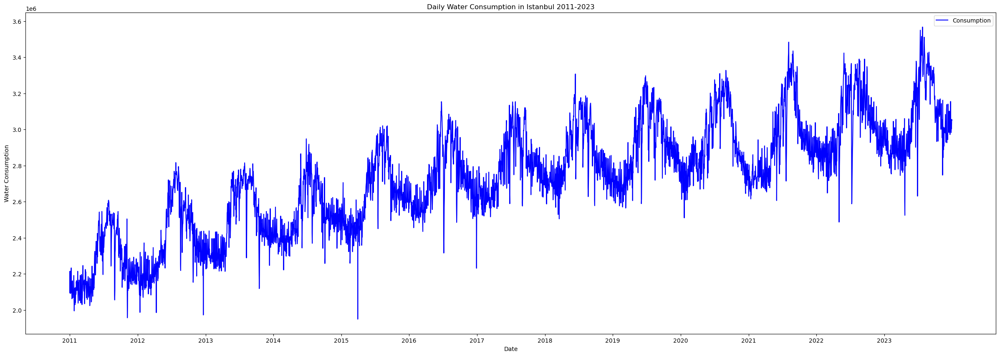

In [4]:
years = masterdf.index.year.unique()
tick_locations = []
tick_labels = []

for year in years:
    tick_locations.append(masterdf.index[masterdf.index.year == year][0])
    tick_labels.append(year)

plt.figure(figsize=(30, 10))
plt.plot(masterdf.index, masterdf["consumption"], color='b', label='Consumption')
plt.title('Daily Water Consumption in Istanbul 2011-2023')
plt.xlabel('Date')
plt.xticks(ticks=tick_locations, labels=tick_labels)
plt.ylabel('Water Consumption')
plt.legend()
plt.show()

Error metrics, plotting and residual plotting function

In [5]:
# prediction dataframe, actual dataframe, True if plot/False if not, True if resid plot/False if not, True if you want to print errors
def compute_error_metrics(predictions, actuals, plot, resid_plot, print_errors):
    if plot==True:
        years = actuals.index.year.unique()
        tick_locations = []
        tick_labels = []

        for year in years:
            tick_locations.append(actuals.index[actuals.index.year == year][0])
            tick_labels.append(year)
        
        plt.figure(figsize=(30, 10))
        plt.plot(actuals.index, actuals, color='b', label='Consumption')
        plt.plot(actuals.index, predictions, color="orange", label="Forecast")
        plt.title('Daily Water Consumption in Istanbul')
        plt.xlabel('Date')
        plt.xticks(ticks=tick_locations, labels=tick_labels)
        plt.ylabel('Water Consumption')
        plt.legend()
        plt.show()
    
    predictions = np.array(predictions)
    actuals = np.array(actuals)
    
    residuals = actuals - predictions
    if resid_plot==True:
        bijan.eplot(residuals)
    
    mse = np.mean(np.square(residuals))
    rmse = np.sqrt(mse)
    mae = np.mean(np.abs(residuals))
    mape = np.mean(np.abs(residuals / actuals )) * 100

    error_metrics = {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    }
    if print_errors==True:
        print(f'MSE: {mse:.2f}')
        print(f'RMSE: {rmse:.2f}')
        print(f'MAE: {mae:.2f}')
        print(f'MAPE: {mape:.2f}%')
    return error_metrics, residuals

# Naive Forecasts

Naive Forecast using **Lag 1**

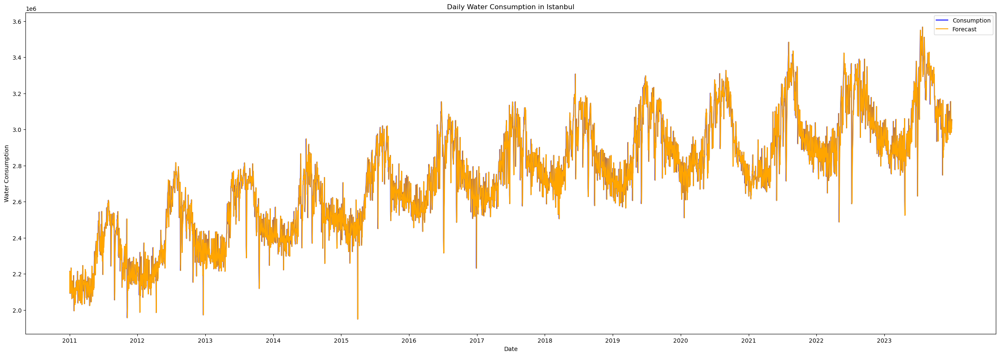

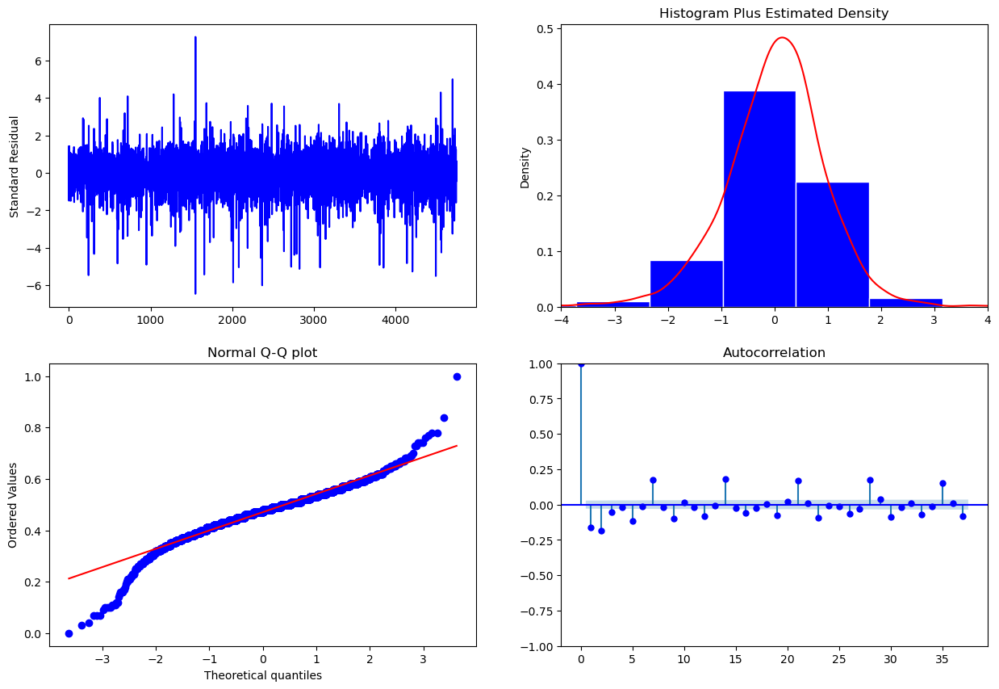

MSE: 6870578764.29
RMSE: 82888.95
MAE: 60558.74
MAPE: 2.24%


In [6]:
Naive1Errors, Naive1Resid = compute_error_metrics(masterdf["lag_1"][1:], masterdf["consumption"][1:], True, True, True)

Naive Forecast using **Lag 7**

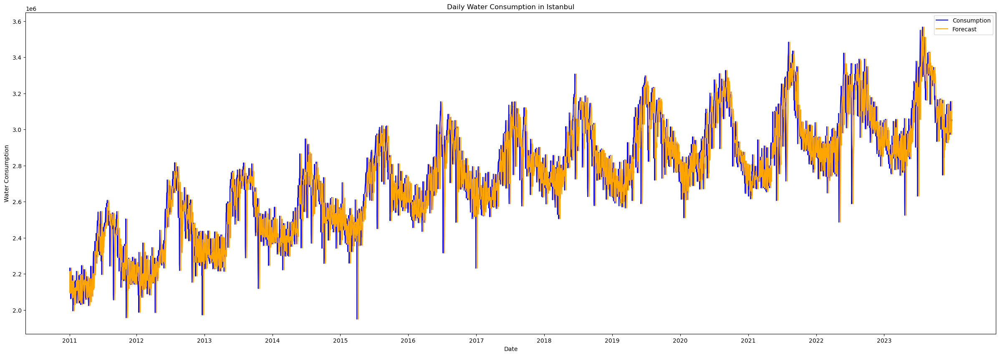

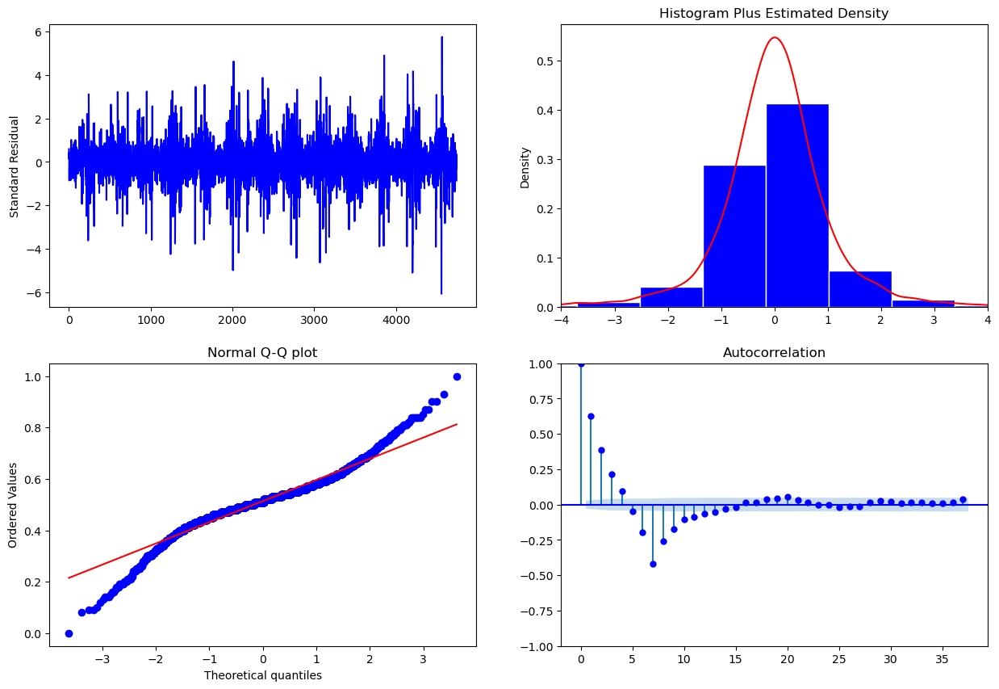

MSE: 15208237188.85
RMSE: 123321.68
MAE: 86367.51
MAPE: 3.15%


In [7]:
Naive7Errors, Naive7Resid = compute_error_metrics(masterdf["lag_7"][7:], masterdf["consumption"][7:], True, True, True)

Naive Forecast using **Lag 365**

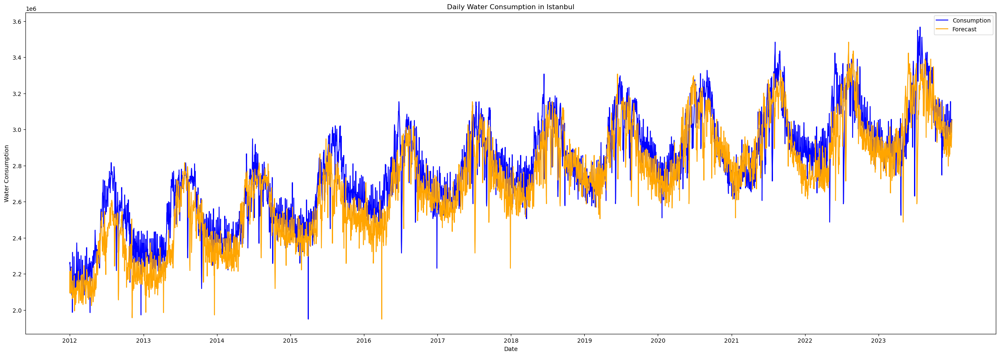

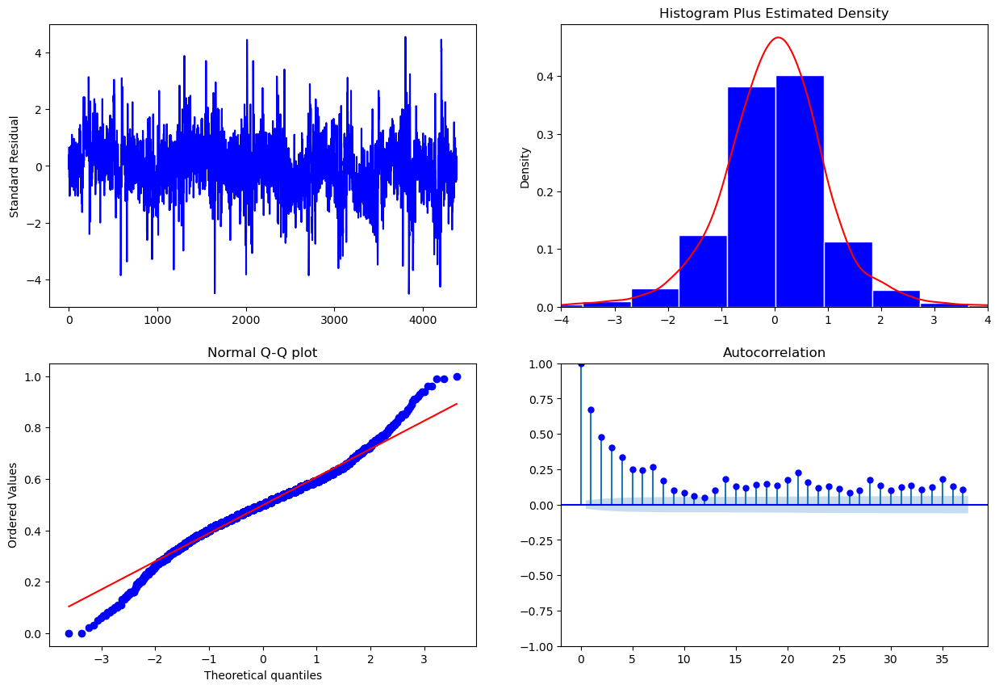

MSE: 25122513887.19
RMSE: 158500.83
MAE: 122577.62
MAPE: 4.41%


In [8]:
Naive365Errors, Naive365Resid = compute_error_metrics(masterdf["lag_365"][365:], masterdf["consumption"][365:], True, True, True)

# Moving Average Forecasts

Moving Average over **7 Periods**

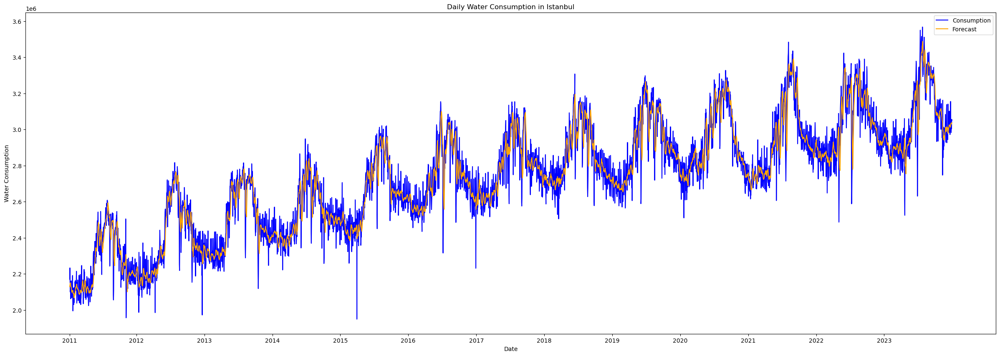

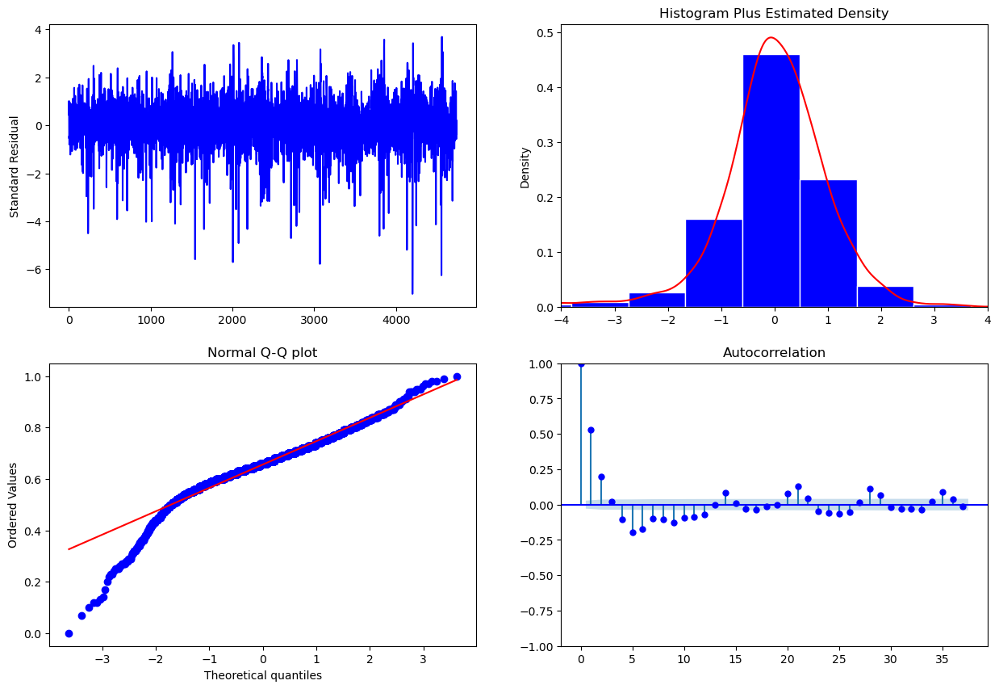

MSE: 8441031382.07
RMSE: 91875.09
MAE: 66364.10
MAPE: 2.44%


In [9]:
MovAvg7 = pd.DataFrame()
MovAvg7 = masterdf["consumption"].rolling(window=7).mean().shift(1).fillna(0)

MovAvg7Errors, MovAvg7Resid = compute_error_metrics(MovAvg7[7:], masterdf["consumption"][7:], True, True, True)

Moving Average over **30 Periods**

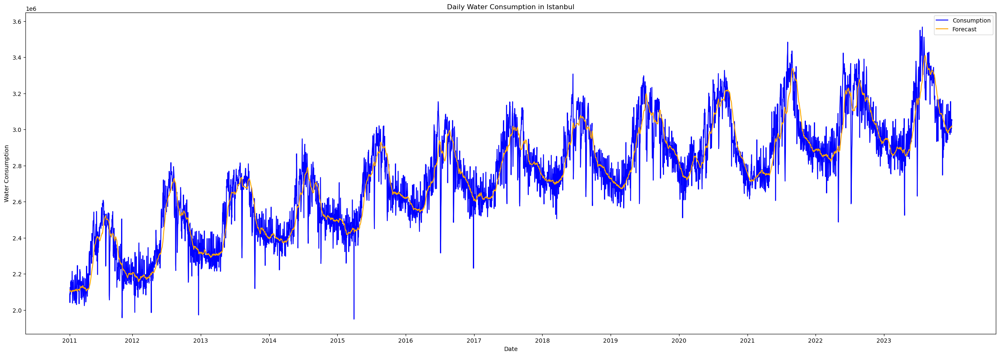

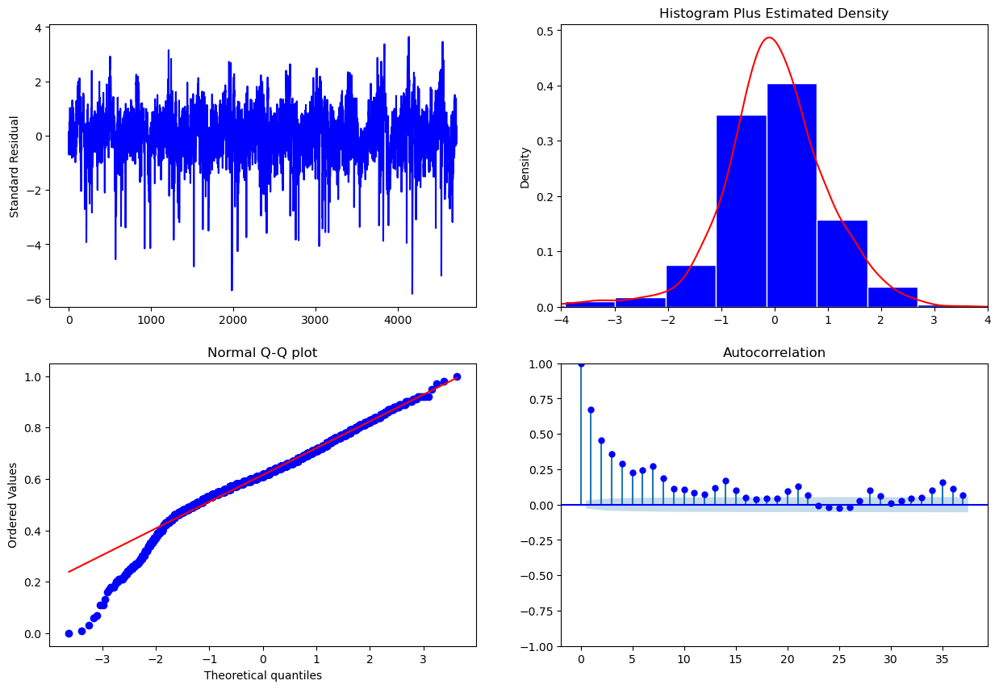

MSE: 10969332117.93
RMSE: 104734.58
MAE: 77300.48
MAPE: 2.82%


In [10]:
MovAvg30 = pd.DataFrame()
MovAvg30 = masterdf["consumption"].rolling(window=30).mean().shift(1).fillna(0)

MovAvg30Errors, MovAvg30Resid = compute_error_metrics(MovAvg30[30:], masterdf["consumption"][30:], True, True, True)

# SARIMA

Differencing

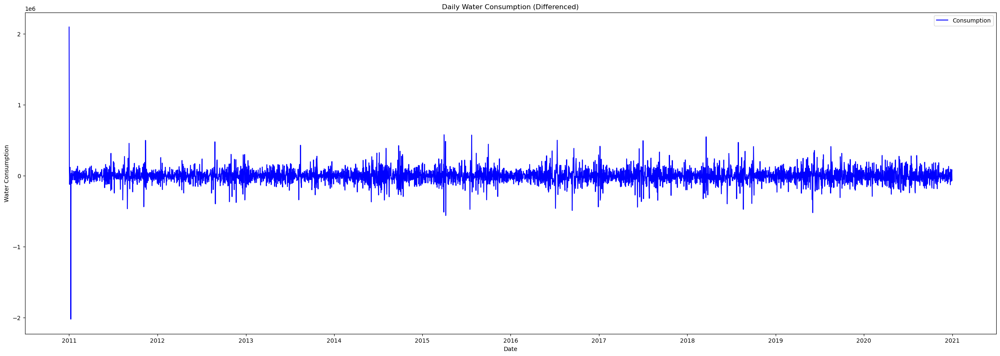

In [11]:
#we are differencing seasons of 7 since yearly SARIMA runtime is large
season_diff = train_set["consumption"] - train_set["consumption"].shift(7).fillna(0)

diff = season_diff - season_diff.shift(1).fillna(0)

plt.figure(figsize=(30, 10))
plt.plot(diff.index, diff[:"2020-12-31"], color='b', label='Consumption')
plt.title('Daily Water Consumption (Differenced)')
plt.xlabel('Date')
plt.xticks(ticks=tick_locations[:-2], labels=tick_labels[:-2])
plt.ylabel('Water Consumption')
plt.legend()
plt.show()

ACF & PACF Plots

c:\Users\lenovo\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


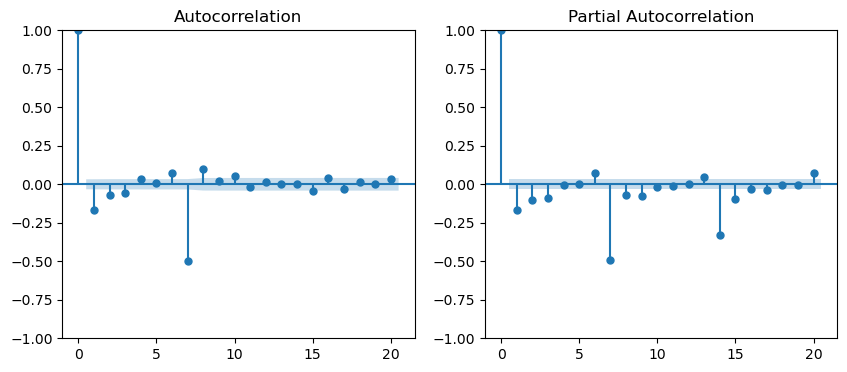

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
fig = sm.graphics.tsa.plot_acf(diff, lags=20, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(diff, lags=20, ax=axes[1])

Fitting Our Model to the Train Set

In [13]:
mod = sm.tsa.statespace.SARIMAX(train_set["consumption"], trend = 'c',
                                            order=(0,1,1),
                                            seasonal_order=(0,1,1,7))

results = mod.fit(disp=False)
results.summary()

c:\Users\lenovo\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\lenovo\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                       consumption   No. Observations:                 3653
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 7)   Log Likelihood              -46456.682
Date:                           Tue, 04 Jun 2024   AIC                          92921.364
Time:                                   18:38:44   BIC                          92946.169
Sample:                               01-01-2011   HQIC                         92930.199
                                    - 12-31-2020                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      4.8463    178.805      0.027      0.978    -345.605     355.298
ma.L1         -0.2675      0.017    -15.336      0.000      -0.302      -0.233
ma.S.L7       -0.8950      0.012    -74.652      0.000      -0.919      -0.872
sigma2      1.041e+10   4.92e-05   2.12e+14      0.000    1.04e+10    1.04e+10
===================================================================================
Ljung-Box (L1) (Q):                   2.68   Jarque-Bera (JB):              5766.51
Prob(Q):                              0.10   Prob(JB):                         0.00
Heteroskedasticity (H):               1.04   Skew:                            -1.04
Prob(H) (two-sided):                  0.54   Kurtosis:                         8.80
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.12e+30. Standard errors may be unstable.
"""

Performance on the Train Set

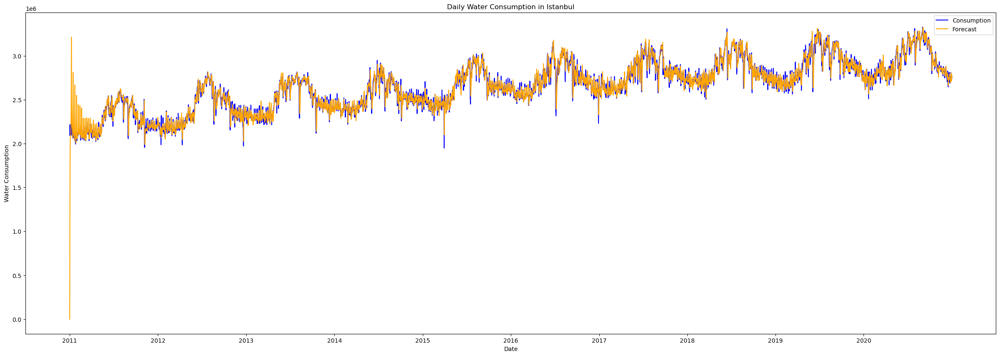

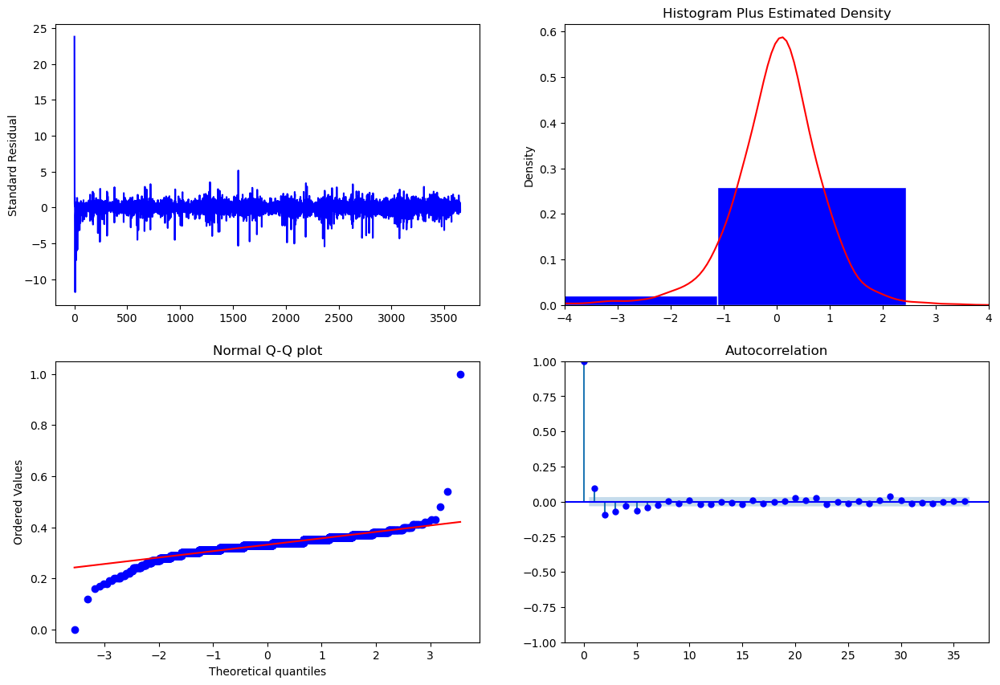

MSE: 7775245379.94
RMSE: 88177.35
MAE: 56004.25
MAPE: 2.14%


In [14]:
sarimaTrainPred = results.get_prediction(start=train_set.index[0], end=train_set.index[-1]).predicted_mean
sarimaTrainErrors, SarimaTrainResid = compute_error_metrics(sarimaTrainPred, train_set["consumption"], True, True, True)

Performance on the Test Set

In [15]:
mod_masterdf = sm.tsa.statespace.SARIMAX(masterdf["consumption"], trend = 'c',
                                            order=(0,1,1),
                                            seasonal_order=(0,1,1,7))
resTest = mod_masterdf.filter(results.params) # use the parameters estimated from the training data
resTest.summary()

c:\Users\lenovo\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\lenovo\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                       consumption   No. Observations:                 4748
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 7)   Log Likelihood              -60436.274
Date:                           Tue, 04 Jun 2024   AIC                         120880.548
Time:                                   18:38:47   BIC                         120906.404
Sample:                               01-01-2011   HQIC                        120889.635
                                    - 12-31-2023                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      4.8463    154.244      0.031      0.975    -297.466     307.159
ma.L1         -0.2675      0.015    -18.312      0.000      -0.296      -0.239
ma.S.L7       -0.8950      0.010    -85.990      0.000      -0.915      -0.875
sigma2      1.041e+10   4.28e-05   2.43e+14      0.000    1.04e+10    1.04e+10
===================================================================================
Ljung-Box (L1) (Q):                   8.25   Jarque-Bera (JB):              6931.96
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.02   Skew:                            -1.04
Prob(H) (two-sided):                  0.76   Kurtosis:                         8.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.83e+28. Standard errors may be unstable.
"""

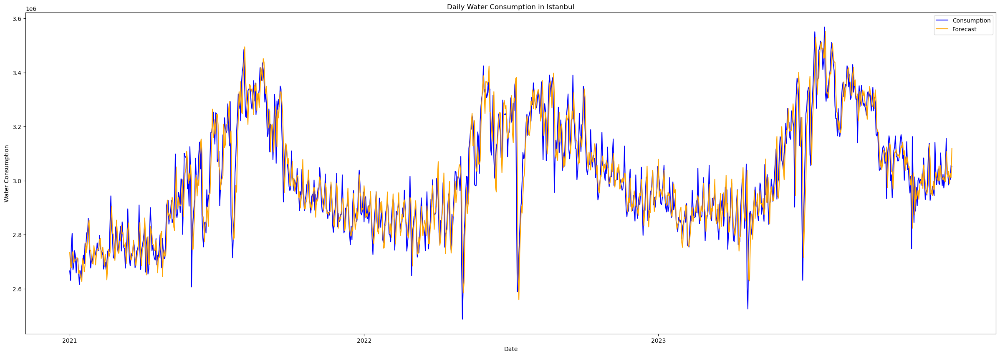

MSE: 6554091616.43
RMSE: 80957.34
MAE: 57513.26
MAPE: 1.92%


In [16]:
sarimaTestPred = resTest.get_prediction(start=test_set.index[0], end=test_set.index[-1]).predicted_mean
sarimaTestErrors, sarimaTestResid = compute_error_metrics(sarimaTestPred, test_set["consumption"], True, False, True)

# Exponential Smoothing

Seasonal Coefficient Estimator Calculator Function

In [17]:
def find_c_t(gamma: float,
             N: int,
             results: pd.DataFrame,
             t: int) -> float:
    
    if t <= N:
        return results.loc[t, 'D_t'] / np.mean(results.loc[:N, 'D_t'])
    
    else:
        return gamma * (results.loc[t, 'D_t'] / results.loc[t, 'S_t']) + (1 - gamma) * results.loc[t - N, 'c_t']

Level Coefficient Estimator Function

In [18]:
def find_S_t(alpha: float,
             N: int,
             results: pd.DataFrame,
             t: int) -> float:

    if t == N + 1:
        return results.loc[t, 'D_t'] / results.loc[t - N, 'c_t']
    
    else:
        return alpha * (results.loc[t, 'D_t'] / results.loc[t - N, 'c_t']) + (1 - alpha) * (results.loc[t - 1, 'S_t'] + results.loc[t - 1, 'G_t'])

Trend Coefficient Estimator Function

In [19]:
def find_G_t(beta: float,
             N: int,
             results: pd.DataFrame,
             t: int) -> float:

    if t == N + 1:
        return results.loc[t, 'S_t'] - (results.loc[t - 1, 'D_t'] / results.loc[t - 1, 'c_t'])

    else:
        return beta * (results.loc[t, 'S_t'] - results.loc[t - 1, 'S_t']) + (1 - beta) * results.loc[t - 1, 'G_t']


Forecast Function

In [20]:
def find_F_t(tau: int,
             N: int,
             results: pd.DataFrame,
             t: int,
             data_len: int) -> float:

    c_index = t - N
    if c_index > data_len:
        c_index = data_len

    S_index = t - tau
    if S_index > data_len:
        S_index = data_len

    G_index = t - tau
    if G_index > data_len:
        G_index = data_len

    return ((results.loc[S_index, 'S_t'] + tau * results.loc[G_index, 'G_t']) *
            results.loc[c_index, 'c_t'])

Function for Triple Exponential Process

In [21]:
def triple_exp_smoothing(alpha: float,
                         beta: float,
                         gamma: float,
                         N: int,
                         max_forecast_horizon: int,
                         data: list) -> list[float]:

    results = pd.DataFrame(columns=['t', 'D_t', 'S_t', 'G_t', 'c_t', 'F_t'],
                           index=range(1, len(data) + 1))

    results['t'] = range(1, len(data) + 1)
    results['D_t'] = data

    length_of_data = len(data)

    for t in results['t'].tolist():

        if t <= N:
            results.loc[t, 'c_t'] = find_c_t(gamma, N, results, t)

        elif t == N + 1:
            results.loc[t, 'S_t'] = find_S_t(alpha, N, results, t)
            results.loc[t, 'G_t'] = find_G_t(beta, N, results, t)
            results.loc[t, 'c_t'] = find_c_t(gamma, N, results, t)

        else:
            results.loc[t, 'S_t'] = find_S_t(alpha, N, results, t)
            results.loc[t, 'G_t'] = find_G_t(beta, N, results, t)
            results.loc[t, 'c_t'] = find_c_t(gamma, N, results, t)
            results.loc[t, 'F_t'] = find_F_t(1, N, results, t, length_of_data)

    for tau in range(1, max_forecast_horizon + 1):
        new_row = [len(data) + tau + 1, np.nan, np.nan, np.nan, np.nan, np.nan]
        results.loc[len(data) + tau + 1] = new_row

        results.loc[len(data) + tau + 1, 'F_t'] = find_F_t(tau,
                                                           N,
                                                           results,
                                                           len(data) + tau,
                                                           length_of_data)
    results['t'] = results['t'].astype(int)

    forecasts = results['F_t'].tolist()

    return forecasts

Searching for the Forecast with the Lowest MAPE and Its Corresponding Coefficients

In [22]:
ALL_PARAMS_DF = pd.DataFrame(columns=['ALPHA', 'BETA', 'GAMMA',
                                      'RMSE', 'MAPE', 'MAE', 'MSE'])
SEASON = 365
MAX_TAU = 1
for ALPHA in np.arange(0.1, 1.1, 0.2):
    for BETA in np.arange(0.1, 1.1, 0.2):
        for GAMMA in np.arange(0.1, 1.1, 0.2):
            RESULTS = triple_exp_smoothing(ALPHA, BETA, GAMMA, SEASON, MAX_TAU, masterdf["consumption"].tolist())
            TripExpErrors, TripExpResid = compute_error_metrics(RESULTS[366:-1], masterdf["consumption"][366:],False, False, False)
            ALL_PARAMS_DF.loc[len(ALL_PARAMS_DF)] = [ALPHA, BETA, GAMMA,
                                                     TripExpErrors["RMSE"], TripExpErrors["MAPE"], TripExpErrors["MAE"], TripExpErrors["MSE"]]
ALL_PARAMS_DF.sort_values('MAPE').head(10)

,ALPHA,BETA,GAMMA,RMSE,MAPE,MAE,MSE
78,0.7,0.1,0.7,101887.432952,2.794341,76490.557323,1.038105e+10
52,0.5,0.1,0.5,102380.665481,2.817962,77180.944537,1.048180e+10
77,0.7,0.1,0.5,102588.405179,2.820038,77155.628652,1.052438e+10
79,0.7,0.1,0.9,102646.393487,2.827955,77521.686246,1.053628e+10
51,0.5,0.1,0.3,103335.731228,2.844288,77788.898913,1.067827e+10
53,0.5,0.1,0.7,104382.630170,2.881957,79140.960982,1.089573e+10
26,0.3,0.1,0.3,106615.648212,2.914155,79784.496611,1.136690e+10
76,0.7,0.1,0.3,105972.778942,2.926643,80124.902654,1.123023e+10
104,0.9,0.1,0.9,107288.296421,2.955291,80894.230809,1.151078e+10
54,0.5,0.1,0.9,108037.435294,2.982028,82085.239329,1.167209e+10


Forecasting with optimal parameters

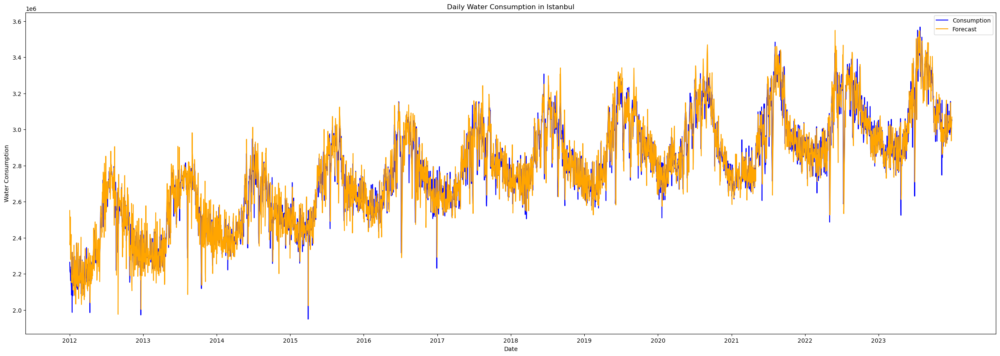

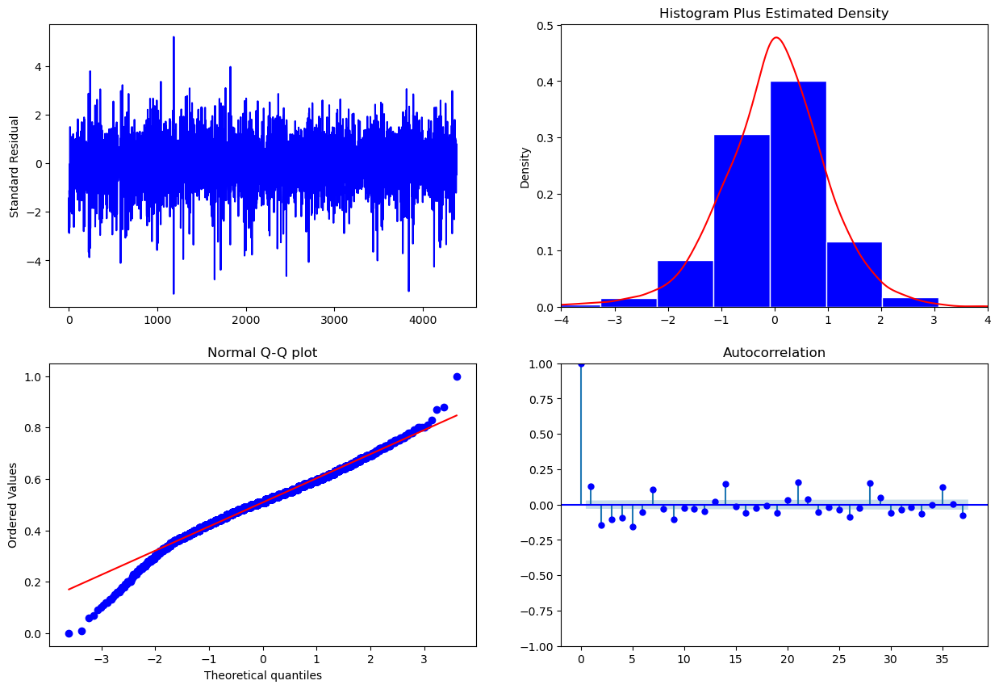

MSE: 10381048993.47
RMSE: 101887.43
MAE: 76490.56
MAPE: 2.79%


In [23]:
alpha_star, beta_star, gamma_star = ALL_PARAMS_DF.sort_values('MAPE').head(10).iloc[0, :3]
TripExpStar = triple_exp_smoothing(alpha_star, beta_star, gamma_star, SEASON, MAX_TAU, masterdf["consumption"].tolist())
TripExpErrors, TripExpResid = compute_error_metrics(TripExpStar[366:-1], masterdf["consumption"][366:],True, True, True)

# Regression Model

Initial Regression Model Fitting

In [24]:
formula = 'consumption ~ ' + ' + '.join(masterdf.columns[1:])
lmtrain = sm.OLS.from_formula(formula, train_set)
resulttrain = lmtrain.fit()

resulttrain.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            consumption   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     2250.
Date:                Tue, 04 Jun 2024   Prob (F-statistic):               0.00
Time:                        18:42:25   Log-Likelihood:                -45908.
No. Observations:                3653   AIC:                         9.187e+04
Df Residuals:                    3628   BIC:                         9.202e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.354e+05   1.48e+05      0.918      0.359   -1.54e+05    4.25e+05
temp        5790.4641    425.012     13.624      0.000    4957.178    6623.750
rain       -4.019e+04   2492.891    -16.124      0.000   -4.51e+04   -3.53e+04
popul          0.0580      0.011      5.160      0.000       0.036       0.080
YearTrend   1.889e+04   2413.757      7.827      0.000    1.42e+04    2.36e+04
Tuesday    -1.181e+04   4342.066     -2.720      0.007   -2.03e+04   -3297.777
Wednesday   1.689e+04   4401.968      3.837      0.000    8259.373    2.55e+04
Thursday    2.651e+04   4381.646      6.049      0.000    1.79e+04    3.51e+04
Friday      1.055e+04   4354.644      2.423      0.015    2011.799    1.91e+04
Saturday    3.231e+04   4378.204      7.380      0.000    2.37e+04    4.09e+04
Sunday      6.014e+04   4369.055     13.765      0.000    5.16e+04    6.87e+04
February   -1.697e+04   5753.087     -2.950      0.003   -2.82e+04   -5690.300
March      -2.415e+04   5739.090     -4.208      0.000   -3.54e+04   -1.29e+04
April      -2.311e+04   6210.852     -3.720      0.000   -3.53e+04   -1.09e+04
May         8847.3192   7313.347      1.210      0.226   -5491.362    2.32e+04
June        3.627e+04   8885.803      4.082      0.000    1.88e+04    5.37e+04
July        4.304e+04   9771.601      4.405      0.000    2.39e+04    6.22e+04
August      2.836e+04   9829.133      2.886      0.004    9092.890    4.76e+04
September   3.059e+04   8877.164      3.446      0.001    1.32e+04     4.8e+04
October     1364.1793   7162.709      0.190      0.849   -1.27e+04    1.54e+04
November    1.277e+04   6338.807      2.014      0.044     337.986    2.52e+04
December    2.105e+04   5782.673      3.641      0.000    9715.707    3.24e+04
lag_1          0.5229      0.012     41.933      0.000       0.498       0.547
lag_7          0.0197      0.009      2.162      0.031       0.002       0.037
lag_365        0.0091      0.002      3.945      0.000       0.005       0.014
==============================================================================
Omnibus:                      951.682   Durbin-Watson:                   1.787
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            73713.744
Skew:                           0.140   Prob(JB):                         0.00
Kurtosis:                      25.005   Cond. No.                     1.96e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.96e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Results on Train Set

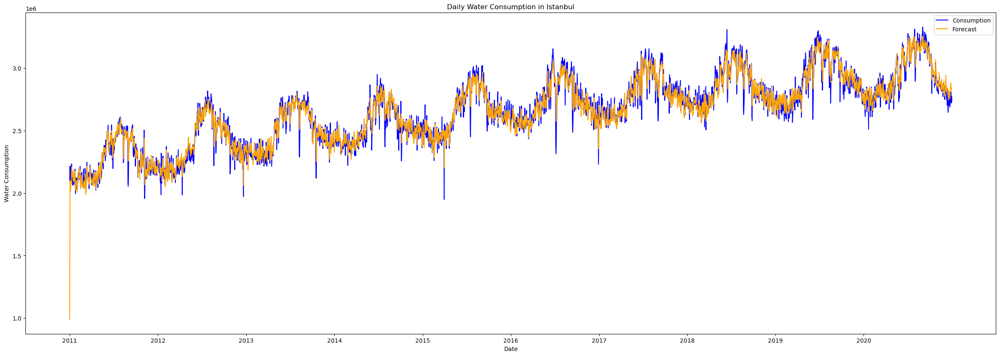

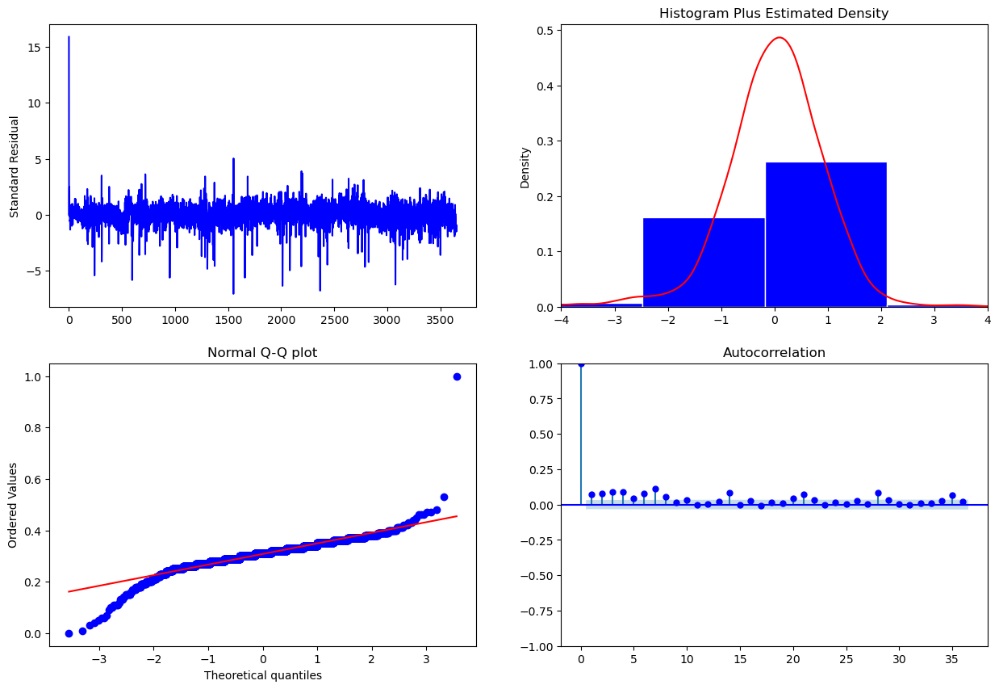

MSE: 4822535312.78
RMSE: 69444.48
MAE: 48730.26
MAPE: 1.85%


In [25]:
Reg1TrainErrors, Reg1TrainResid = compute_error_metrics(resulttrain.predict(train_set), train_set["consumption"], True, True, True)

Results on the Test Set

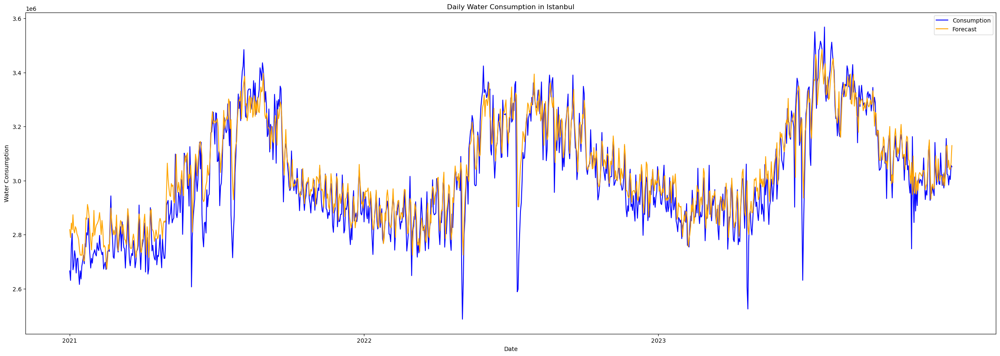

MSE: 6451211060.96
RMSE: 80319.43
MAE: 58572.34
MAPE: 1.98%


In [26]:
Reg1TestErrors, Reg1TestResid = compute_error_metrics(resulttrain.predict(test_set), test_set["consumption"], True, False, True)

## Lasso

Standardization

In [27]:
y_train = train_set.iloc[:,0]
x_train = train_set.iloc[:,1:]

y_test = test_set.iloc[:,0]
x_test = test_set.iloc[:,1:]

scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

Plotting and Testing with Different $\alpha$ values

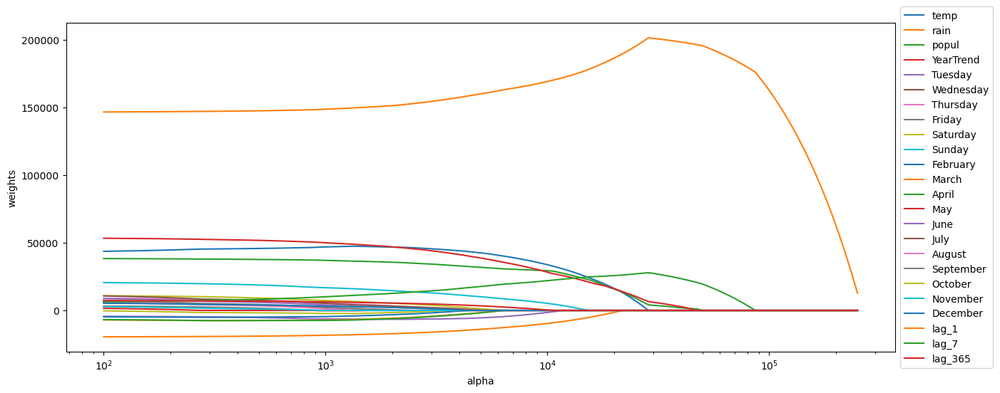

In [28]:
alphas = np.linspace(100,250000,10000)

lasso = Lasso(max_iter=50000)

coefs = [] 
MSE_train = []
MSE_test=[]

for a in alphas:
    with warnings.catch_warnings(record=True) as caught_warnings:
        lasso.set_params(alpha=a)
        lasso.fit(x_train_scaled, y_train)
        warnings.filterwarnings("ignore", message="Set parameter alpha")
        coefs.append(lasso.coef_) 
        mse_train = mean_squared_error(y_train, lasso.predict(x_train_scaled))
        mse_test = mean_squared_error(y_test, lasso.predict(x_test_scaled))
        MSE_train.append(mse_train)   
        MSE_test.append(mse_test)   
    
fig, ax = plt.subplots()
fig.set_size_inches(15, 6)
ax = plt.gca()
ax.plot(alphas, coefs, label=x_train.columns)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [29]:
model_params = {
    'Lasso' :{
        'model' : Lasso(random_state=6),
        'params' : {
            'alpha' : np.linspace(10,4000,1000),
        }
    },
}

Finding $\alpha^*$ and Using 5-Fold Cross Validation

In [30]:
scores = []

for model_name, mp in model_params.items():

# scoring='neg_mean_squared_error'
    reg = GridSearchCV(mp['model'], mp['params'], cv=5, n_jobs=-1)
    with warnings.catch_warnings(record=True) as caught_warnings:
        reg.fit(x_train_scaled, y_train)
        scores.append({
            'Model': model_name,
            'Best Score' : reg.best_score_,
            'Best Parameters' : reg.best_params_
        })

best_param = pd.DataFrame(scores, columns=['Model', 'Best Score', 'Best Parameters'])
pd.set_option('display.max_colwidth', None)
best_param = best_param.sort_values(by=['Best Score'], ascending=[False])
best_param.reset_index(drop=True, inplace=True)

# optimal alpha
opt_alpha = scores[0]['Best Parameters']['alpha']

best_param

,Model,Best Score,Best Parameters
0,Lasso,0.817739,{'alpha': 365.46546546546546}


Model Fitting Using $\alpha^*$

In [31]:
# fit lasso under optimal alpha: "opt_alpha"
lasso.set_params(alpha=opt_alpha)

with warnings.catch_warnings(record=True) as caught_warnings:
    lasso.fit(x_train_scaled, y_train)
    lasso.coef_

# predict for train set
y_pred_train = lasso.predict(x_train_scaled)

# the Error rates in the training set
resid_train = y_train - y_pred_train
mse_train = mean_squared_error(y_train, y_pred_train)
mape_train= np.mean(np.abs(resid_train/y_train))


# predict for test set
y_pred_test = lasso.predict(x_test_scaled)

# the Error rates in the test set
resid_test = y_test - y_pred_test
mse_test = mean_squared_error(y_test, y_pred_test)
mape_test= np.mean(np.abs(resid_test/y_test))

z = 0
for i in x_test.columns:
    print(f'coef of {i} >> {lasso.coef_[z]}')
    z += 1
print()  
print()  
print('MAPE Train = {:.2f}%'.format(mape_train*100))
print('MSE Train = {:,.0f}'.format(mse_train))
print('RMSE Train = {:,.0f}'.format(np.sqrt(mse_train)))
print()  
print()  
print('MAPE Test = {:.2f}%'.format(mape_test*100))
print('MSE Test = {:,.0f}'.format(mse_test))
print('RMSE Test = {:,.0f}'.format(np.sqrt(mse_test)))
print()  
print() 
print('RMSE_Test/RMSE_Initial = {:,.5f} '.format(np.sqrt(mse_test)/Reg1TestErrors["RMSE"]))

coef of temp >> 45566.1834686685
coef of rain >> -19192.15070191835
coef of popul >> 37882.87362197387
coef of YearTrend >> 52293.527639642394
coef of Tuesday >> -4980.352100334406
coef of Wednesday >> 4448.898199287945
coef of Thursday >> 7760.9151804049
coef of Friday >> 2204.3271386093884
coef of Saturday >> 9783.925337922452
coef of Sunday >> 19400.06620884165
coef of February >> -5034.972031997654
coef of March >> -7494.073883808733
coef of April >> -7510.303949478569
coef of May >> 0.0
coef of June >> 6459.867889897681
coef of July >> 8043.0671767183485
coef of August >> 3939.322188411913
coef of September >> 4869.697352691505
coef of October >> -1627.4048140583002
coef of November >> 1382.0514331142253
coef of December >> 4268.234075076156
coef of lag_1 >> 147377.57479816207
coef of lag_7 >> 7803.294553003202
coef of lag_365 >> 6951.3604002311495


MAPE Train = 1.86%
MSE Train = 4,829,585,150
RMSE Train = 69,495


MAPE Test = 1.97%
MSE Test = 6,367,197,390
RMSE Test = 79,795


R

New Fit by Removing May

In [32]:
combined_formula = list(masterdf.columns[1:14]) + list(masterdf.columns[15:])
formula2 = 'consumption ~ ' + ' + '.join(combined_formula)
ml_red = sm.OLS.from_formula(formula2, train_set)
model_red = ml_red.fit()
model_red.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            consumption   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     2348.
Date:                Tue, 04 Jun 2024   Prob (F-statistic):               0.00
Time:                        18:43:12   Log-Likelihood:                -45909.
No. Observations:                3653   AIC:                         9.187e+04
Df Residuals:                    3629   BIC:                         9.201e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.364e+05   1.48e+05      0.925      0.355   -1.53e+05    4.26e+05
temp        6070.4791    356.476     17.029      0.000    5371.565    6769.393
rain       -4.019e+04   2493.049    -16.121      0.000   -4.51e+04   -3.53e+04
popul          0.0576      0.011      5.129      0.000       0.036       0.080
YearTrend   1.878e+04   2412.230      7.786      0.000    1.41e+04    2.35e+04
Tuesday    -1.171e+04   4341.612     -2.698      0.007   -2.02e+04   -3202.251
Wednesday   1.698e+04   4401.562      3.859      0.000    8354.286    2.56e+04
Thursday    2.656e+04   4381.677      6.062      0.000     1.8e+04    3.52e+04
Friday      1.064e+04   4354.225      2.444      0.015    2106.897    1.92e+04
Saturday    3.234e+04   4378.438      7.385      0.000    2.38e+04    4.09e+04
Sunday      6.006e+04   4368.787     13.747      0.000    5.15e+04    6.86e+04
February   -1.986e+04   5232.532     -3.796      0.000   -3.01e+04   -9604.746
March      -2.764e+04   4961.141     -5.572      0.000   -3.74e+04   -1.79e+04
April      -2.764e+04   4954.702     -5.578      0.000   -3.74e+04   -1.79e+04
June        2.836e+04   6019.602      4.712      0.000    1.66e+04    4.02e+04
July        3.426e+04   6539.793      5.239      0.000    2.14e+04    4.71e+04
August      1.951e+04   6563.442      2.973      0.003    6643.918    3.24e+04
September   2.272e+04   6038.041      3.762      0.000    1.09e+04    3.46e+04
October    -4693.6085   5121.813     -0.916      0.360   -1.47e+04    5348.310
November    7971.9447   4947.692      1.611      0.107   -1728.588    1.77e+04
December    1.759e+04   5023.179      3.501      0.000    7738.436    2.74e+04
lag_1          0.5233      0.012     41.978      0.000       0.499       0.548
lag_7          0.0217      0.009      2.424      0.015       0.004       0.039
lag_365        0.0089      0.002      3.893      0.000       0.004       0.013
==============================================================================
Omnibus:                      956.311   Durbin-Watson:                   1.786
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            74768.944
Skew:                           0.152   Prob(JB):                         0.00
Kurtosis:                      25.162   Cond. No.                     1.96e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.96e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Test Set Performance

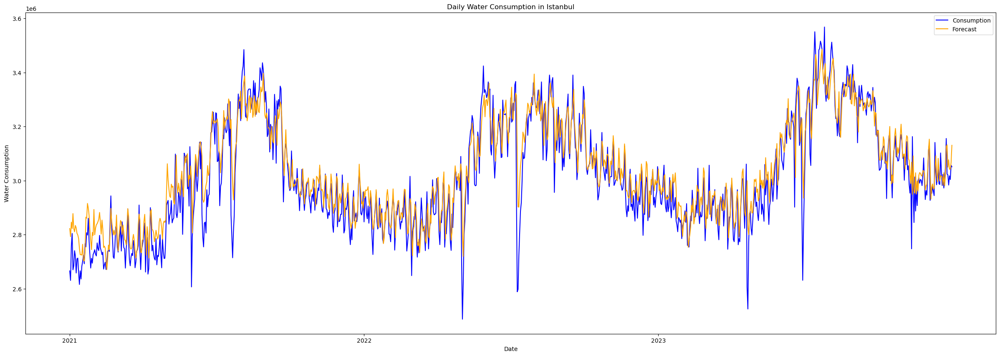

MSE: 6429152759.10
RMSE: 80182.00
MAE: 58535.75
MAPE: 1.98%


In [33]:
cons_pred = model_red.predict(test_set)

actual_cons_test = test_set.iloc[:,0]

LassoErrors, LassoResid = compute_error_metrics(cons_pred, actual_cons_test, True, False, True)

# K-Nearest Neighbours Regression

1-NN

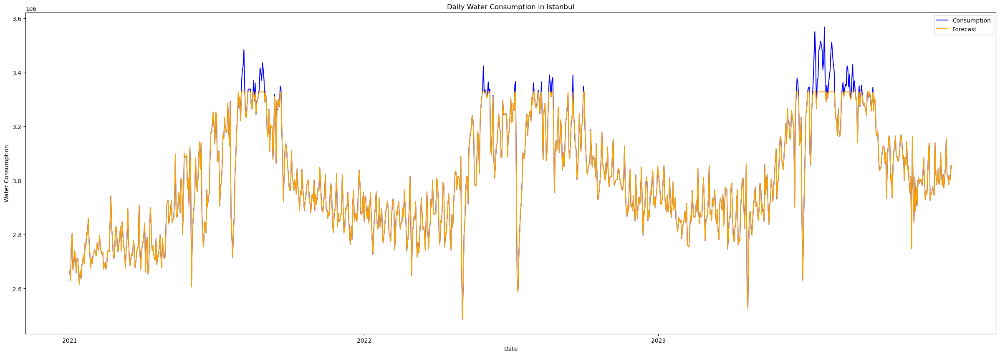

MSE: 519246673.10
RMSE: 22786.98
MAE: 4955.42
MAPE: 0.15%


In [34]:
knn_1 = neighbors.KNeighborsRegressor(1, weights='distance')
y_test1 = knn_1.fit(train_set["consumption"].to_numpy().reshape(-1,1), train_set["consumption"]).predict(test_set["consumption"].to_numpy().reshape(-1,1))

KNN1Errors, KNN1Resid = compute_error_metrics(y_test1, test_set["consumption"], True, False, True)

5-NN

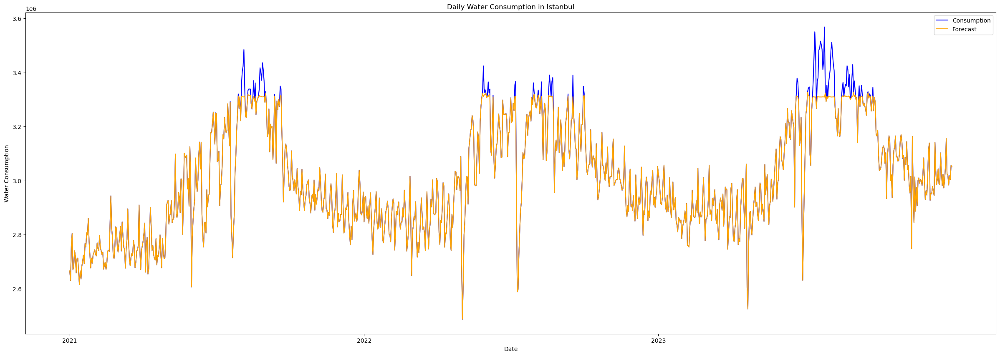

MSE: 704218530.94
RMSE: 26537.12
MAE: 6069.49
MAPE: 0.18%


In [35]:
knn_5 = neighbors.KNeighborsRegressor(5, weights='distance')
y_test5 = knn_5.fit(train_set["consumption"].to_numpy().reshape(-1,1), train_set["consumption"]).predict(test_set["consumption"].to_numpy().reshape(-1,1))

KNN5Errors, KNN5Resid = compute_error_metrics(y_test5, test_set["consumption"], True, False, True)

10-NN

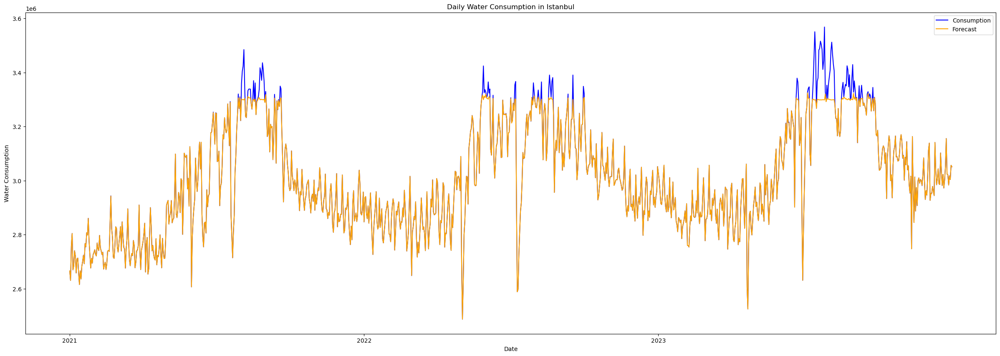

MSE: 833570305.18
RMSE: 28871.62
MAE: 6964.97
MAPE: 0.20%


In [36]:
knn_10 = neighbors.KNeighborsRegressor(10, weights='distance')
y_test10 = knn_10.fit(train_set["consumption"].to_numpy().reshape(-1,1), train_set["consumption"]).predict(test_set["consumption"].to_numpy().reshape(-1,1))

KNN10Errors, KNN10Resid = compute_error_metrics(y_test10, test_set["consumption"], True, False, True)

# Tree-Based Regression

Train Set Performance

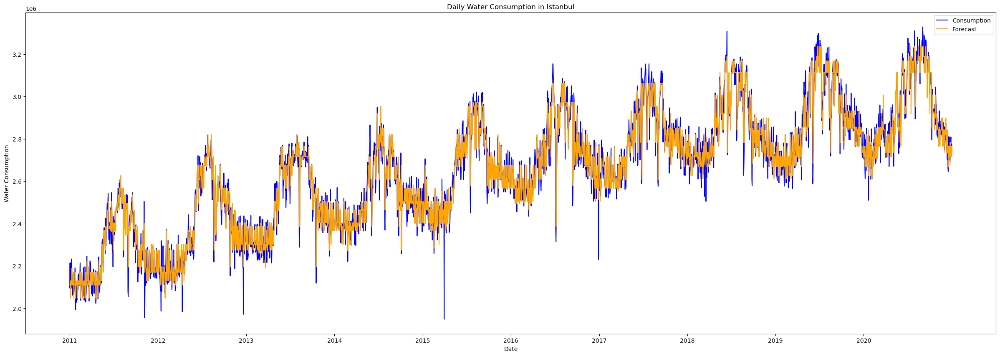

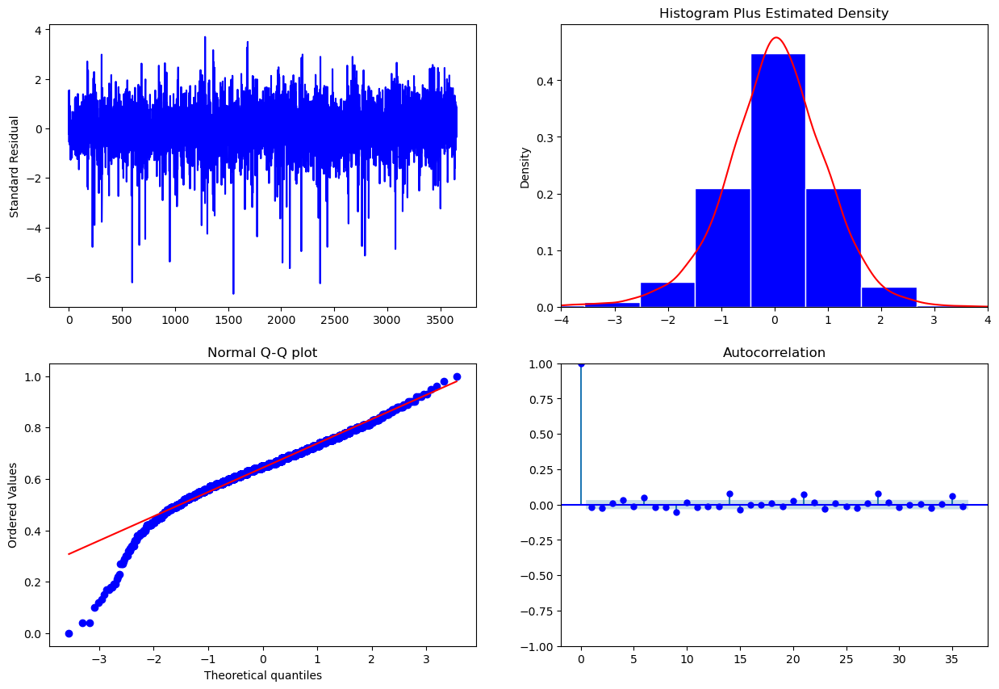

MSE: 4586013069.13
RMSE: 67720.11
MAE: 50072.61
MAPE: 1.90%


In [37]:
y_train = train_set.iloc[:,0]
x_train = train_set.iloc[:,1:]
DT = DecisionTreeRegressor(random_state=6, max_depth=6)
DT.fit(x_train,y_train)

# Drawing tree of DT

max_depth = 4

fig = plt.figure(figsize=(55, 20), dpi=400)
plot_tree(DT, 
          feature_names=list(x_train.columns),  # Convert to list
          class_names=['consumption'],  # Ensure class_names is a list
          filled=True, impurity=True, 
          rounded=True, max_depth=max_depth, fontsize=10)
fig.savefig('RF.png')

# Prediction based train set

cons_pred = DT.predict(x_train)

actual_cons_train = train_set.iloc[:,0]

TreeTrainErrors, TreeTrainResid = compute_error_metrics(cons_pred, actual_cons_train, True, True, True)

Test Set Performance

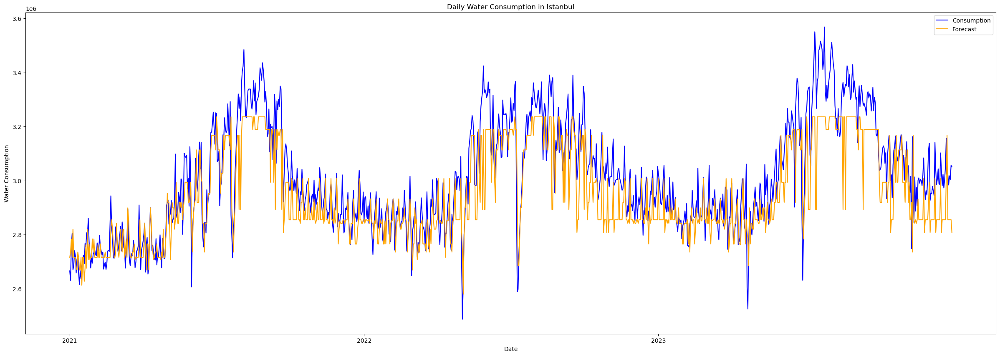

MSE: 13858387853.48
RMSE: 117721.65
MAE: 88779.48
MAPE: 2.89%


In [38]:
y_test = test_set.iloc[:,0]
x_test = test_set.iloc[:,1:]

test_pred = DT.predict(x_test)
TreeTrainErrors, TreeTrainResid = compute_error_metrics(test_pred, y_test, True, False, True)


# Random Forest

Train Set Performance

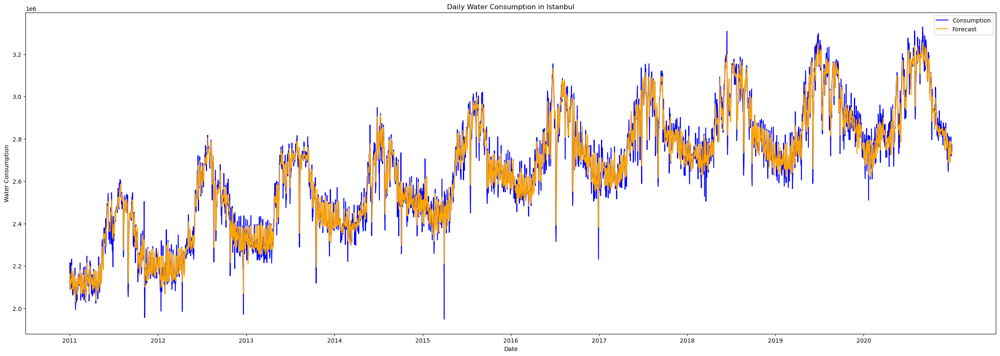

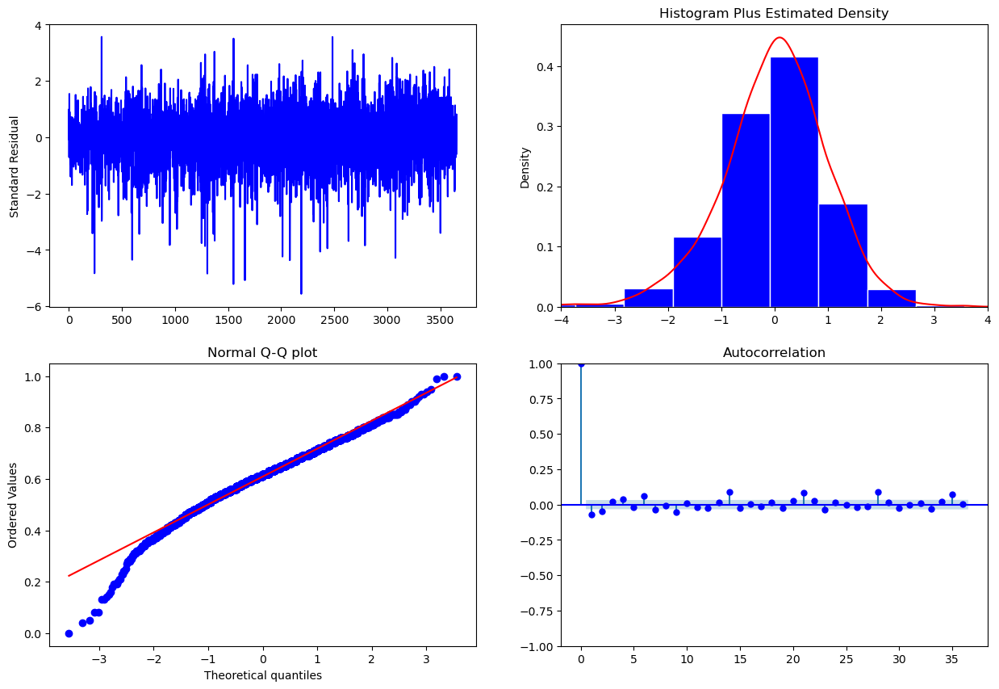

MSE: 2551107460.36
RMSE: 50508.49
MAE: 38564.80
MAPE: 1.46%
Best Depth:  8


In [39]:
param_grid = {'max_depth': range(1, 21)}

# Instantiate the Random Forest model
rf = RandomForestRegressor(random_state=6)

# Perform grid search with five-fold cross-validation

grid_search = GridSearchCV(estimator=rf, param_grid = param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)

best_depth = grid_search.best_params_['max_depth']

# Prediction based training set

rf.set_params(max_depth=best_depth)
rf.fit(x_train, y_train)

pred_vol = rf.predict(x_train)

actual_vol = train_set.iloc[:,0]

ForestTrainErrors, ForestTrainResid = compute_error_metrics(pred_vol, actual_vol, True, True, True)

print('Best Depth: ', best_depth)

Random Forest Importance Graph

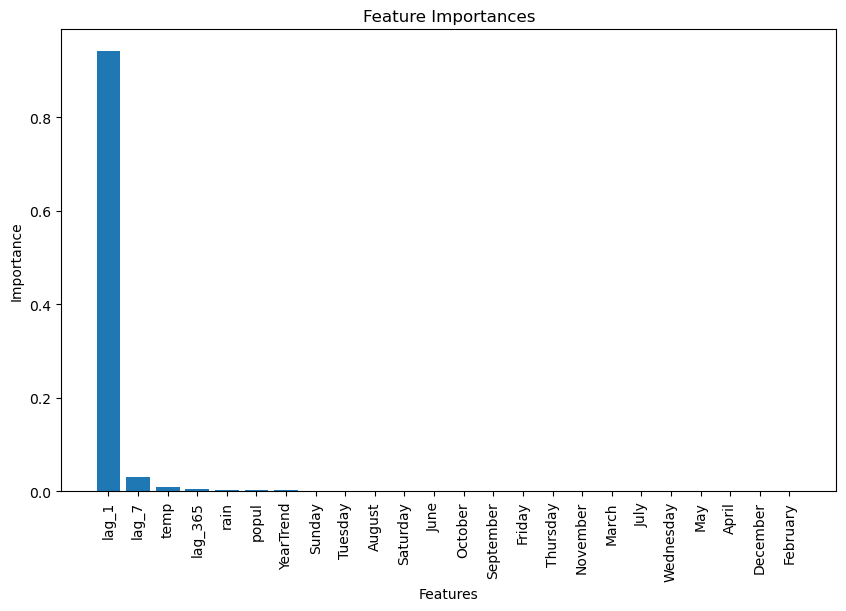

In [40]:
selected_rfe_features = pd.DataFrame({'Feature': list(x_train.columns),'Ranking': rf.feature_importances_})
selected_rfe_features.sort_values(by='Ranking', ascending=False)
# Get feature importances from the model
importances = rf.feature_importances_

# Sort the feature importances in descending order
sorted_indices = np.argsort(importances)[::-1]

# Get the names of the features in the original order
feature_names = list(x_train.columns)


# Plot the feature importances
plt.figure(figsize=(10,6))
plt.bar(range(x_train.shape[1]), importances[sorted_indices])
plt.xticks(range(x_train.shape[1]), [feature_names[i] for i in sorted_indices], rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance")
plt.title("Feature Importances")
plt.show()

Test Set Performance

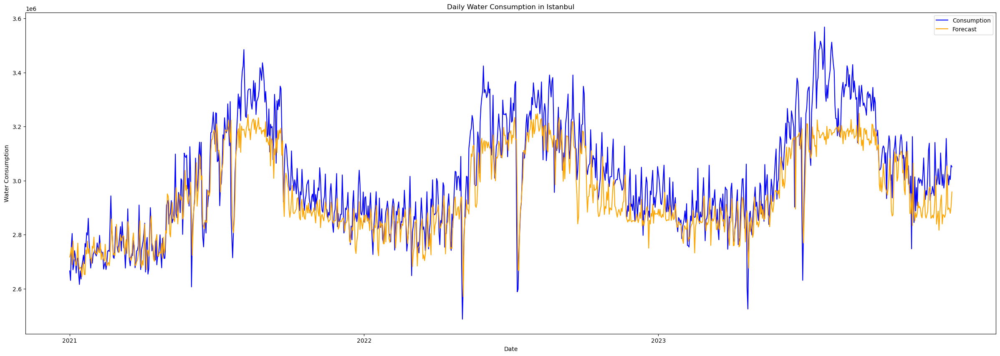

MSE: 11784125746.66
RMSE: 108554.71
MAE: 84821.41
MAPE: 2.75%


In [41]:
test_pred_forest = rf.predict(x_test)
test_actual_forest = test_set.iloc[:,0]

ForestTestErrors, ForestTestResid = compute_error_metrics(test_pred_forest, test_actual_forest, True, False, True)

# Neural Network

Standardization of Data

In [42]:
PredictorScaler=StandardScaler()
TargetVarScaler=StandardScaler()


X = masterdf.iloc[:,1:]
y = masterdf['consumption']

y = y.to_numpy().reshape(-1, 1)

# Storing the fit object for later reference
PredictorScalerFit=PredictorScaler.fit(X)
TargetVarScalerFit=TargetVarScaler.fit(y)

# Generating the standardized values of X and y
X=PredictorScalerFit.transform(X)
y=TargetVarScalerFit.transform(y)


X_train , X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=6, shuffle=False)

Finding the Optimal Size, Batch Size and Activation Function

In [52]:
no_epochs = [10, 30, 50, 70, 90, 110, 130]
batch_size  = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
activations = ['relu', 'sigmoid']
RMSE_TRAIN = {}


for i in no_epochs:
  for j in batch_size:
    for a in activations:
      # create ANN model
      model = Sequential()

      # Defining the Input layer and FIRST hidden layer, both are same!

      no_of_features = 24

      model.add(Dense(units=7, input_dim = no_of_features, kernel_initializer='normal', activation=a))
      model.add(Dense(units=5, kernel_initializer='normal', activation='tanh'))
      # The output neuron is a single fully connected node
      # Since we will be predicting a single number
      model.add(Dense(1, kernel_initializer='normal'))

      # Compiling the model
      model.compile(loss='mean_squared_error', optimizer='adam')

      # Fitting the ANN to the Training set
      model.fit(X_train, y_train ,batch_size = j, epochs = i , verbose=1)

      # Generating Predictions on training data

      y_pred=model.predict(X_train)

      # Scaling the predicted Price data back to original scale
      pred_vol=TargetVarScalerFit.inverse_transform(y_pred)

      # Scaling the y_test Price data back to original scale
      actual_vol=TargetVarScalerFit.inverse_transform(y_train)

      # Prediction based training set

      # Calculate the residual
      resid = actual_vol - pred_vol

      # Calculate the error terms
      mape_1_train_se= np.mean(np.abs(resid/actual_vol))
      mse_1_train_se= np.mean(np.square(resid))
      rmse_1_train_se = np.sqrt(mse_1_train_se)

      RMSE_TRAIN[(i,j,a)] = rmse_1_train_se

Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 3s 840us/step - loss: 0.3271
Epoch 2/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 0.0529
Epoch 3/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 678us/step - loss: 0.0489
Epoch 4/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 718us/step - loss: 0.0474
Epoch 5/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 874us/step - loss: 0.0465
Epoch 6/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 748us/step - loss: 0.0409
Epoch 7/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 876us/step - loss: 0.0449
Epoch 8/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 845us/step - loss: 0.0452
Epoch 9/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0411
Epoch 10/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0428
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 3s 910us/step - loss: 0.4254
Epoch 2/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 859us/step - loss: 0.0650
Epoch 3/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 825us/step - loss: 0.0566
Epoch 4/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 820us/step - loss: 0.0534
Epoch 5/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 854us/step - loss: 0.0511
Epoch 6/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 887us/step - loss: 0.0546
Epoch 7/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 850us/step - loss: 0.0503
Epoch 8/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 892us/step - loss: 0.0528
Epoch 9/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 973us/step - loss: 0.0561
Epoch 10/10
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 836us/step - loss: 0.0531
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 2s 767us/step - loss: 0.4582
Epoch 2/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 897us/step - loss: 0.0672
Epoch 3/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0525
Epoch 4/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 753us/step - loss: 0.0451
Epoch 5/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0432
Epoch 6/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0480
Epoch 7/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0457
Epoch 8/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0436
Epoch 9/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 0.0418
Epoch 10/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 916us/step - loss: 0.0487
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 717us/step - loss: 0.6188
Epoch 2/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 745us/step - loss: 0.0956
Epoch 3/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 748us/step - loss: 0.0627
Epoch 4/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 796us/step - loss: 0.0590
Epoch 5/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 746us/step - loss: 0.0580
Epoch 6/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 880us/step - loss: 0.0527
Epoch 7/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.0517
Epoch 8/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0557
Epoch 9/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.0531
Epoch 10/10
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 0.0521
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 754us/step - loss: 0.6150
Epoch 2/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 773us/step - loss: 0.0962
Epoch 3/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0608
Epoch 4/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0591
Epoch 5/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0476
Epoch 6/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0466
Epoch 7/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 781us/step - loss: 0.0488
Epoch 8/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0473
Epoch 9/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0473
Epoch 10/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0460
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.6509
Epoch 2/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0921
Epoch 3/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0631
Epoch 4/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0589
Epoch 5/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0512
Epoch 6/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0517
Epoch 7/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 944us/step - loss: 0.0538
Epoch 8/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 878us/step - loss: 0.0527
Epoch 9/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0508
Epoch 10/10
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0503
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.5902
Epoch 2/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0735
Epoch 3/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0548
Epoch 4/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0482
Epoch 5/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0494
Epoch 6/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0412
Epoch 7/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0447
Epoch 8/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0418
Epoch 9/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0483
Epoch 10/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0448
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7343
Epoch 2/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1104
Epoch 3/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0804
Epoch 4/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0589
Epoch 5/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0531
Epoch 6/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0520
Epoch 7/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0526
Epoch 8/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0520
Epoch 9/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0498
Epoch 10/10
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0486
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.6148
Epoch 2/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0831
Epoch 3/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0629
Epoch 4/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0470
Epoch 5/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0454
Epoch 6/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0437
Epoch 7/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0458
Epoch 8/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0432
Epoch 9/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0450
Epoch 10/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0451
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7498
Epoch 2/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1044
Epoch 3/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0796
Epoch 4/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0626
Epoch 5/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0585
Epoch 6/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0585
Epoch 7/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0529
Epoch 8/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0544
Epoch 9/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0569
Epoch 10/10
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0520
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 930us/step - loss: 0.7291
Epoch 2/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1534
Epoch 3/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0893
Epoch 4/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0638
Epoch 5/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0560
Epoch 6/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0548
Epoch 7/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0530
Epoch 8/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0540
Epoch 9/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0491
Epoch 10/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0468
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7506
Epoch 2/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1476
Epoch 3/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0892
Epoch 4/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - loss: 0.0733
Epoch 5/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0589
Epoch 6/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0565
Epoch 7/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0557
Epoch 8/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0561
Epoch 9/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0533
Epoch 10/10
317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0504
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6756
Epoch 2/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0972
Epoch 3/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0671
Epoch 4/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0552
Epoch 5/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0486
Epoch 6/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0437
Epoch 7/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0469
Epoch 8/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0464
Epoch 9/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0415
Epoch 10/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0443
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8054
Epoch 2/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3507
Epoch 3/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1202
Epoch 4/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0885
Epoch 5/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0704
Epoch 6/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0607
Epoch 7/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0585
Epoch 8/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0593
Epoch 9/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0531
Epoch 10/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0518
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.7024
Epoch 2/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.1048
Epoch 3/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0815
Epoch 4/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0664
Epoch 5/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 944us/step - loss: 0.0563
Epoch 6/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0533
Epoch 7/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0486
Epoch 8/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0440
Epoch 9/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0452
Epoch 10/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0465
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8335
Epoch 2/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2171
Epoch 3/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0969
Epoch 4/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0730
Epoch 5/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0609
Epoch 6/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0590
Epoch 7/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 0.0552
Epoch 8/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0560
Epoch 9/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0543
Epoch 10/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0512
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 918us/step - loss: 0.7375
Epoch 2/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.1081
Epoch 3/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0778
Epoch 4/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0667
Epoch 5/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0565
Epoch 6/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0485
Epoch 7/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0492
Epoch 8/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0473
Epoch 9/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0457
Epoch 10/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0455
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 874us/step - loss: 0.7787
Epoch 2/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3143
Epoch 3/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.1113
Epoch 4/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0903
Epoch 5/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0783
Epoch 6/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0676
Epoch 7/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0591
Epoch 8/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0597
Epoch 9/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0540
Epoch 10/10
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0565
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7733
Epoch 2/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1063
Epoch 3/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0780
Epoch 4/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0632
Epoch 5/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0494
Epoch 6/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0454
Epoch 7/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0462
Epoch 8/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0470
Epoch 9/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0447
Epoch 10/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0446
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/10


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8365
Epoch 2/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4866
Epoch 3/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1209
Epoch 4/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0907
Epoch 5/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0814
Epoch 6/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0672
Epoch 7/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0640
Epoch 8/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0587
Epoch 9/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0525
Epoch 10/10
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0559
119/119 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Epoch 1/30


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.2925
Epoch 2/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0517
Epoch 3/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0464
Epoch 4/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0484
Epoch 5/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0431
Epoch 6/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0465
Epoch 7/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0442
Epoch 8/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0434
Epoch 9/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0433
Epoch 10/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0427
Epoch 11/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0429
Epoch 12/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0422
Epoch 13/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0446
Epoch 14/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0442
Epoch 15/30
1899/1899 ━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4932
Epoch 2/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0693
Epoch 3/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0555
Epoch 4/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0557
Epoch 5/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0512
Epoch 6/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0552
Epoch 7/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0516
Epoch 8/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0502
Epoch 9/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0538
Epoch 10/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0460
Epoch 11/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0480
Epoch 12/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0494
Epoch 13/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0482
Epoch 14/30
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0529
Epoch 15/30
1899/1899 ━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4101
Epoch 2/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0610
Epoch 3/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0486
Epoch 4/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0441
Epoch 5/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0451
Epoch 6/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0441
Epoch 7/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0419
Epoch 8/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0447
Epoch 9/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0424
Epoch 10/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0424
Epoch 11/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0456
Epoch 12/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0454
Epoch 13/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0451
Epoch 14/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0443
Epoch 15/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0414


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.6071
Epoch 2/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1055
Epoch 3/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0683
Epoch 4/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0584
Epoch 5/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0548
Epoch 6/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0512
Epoch 7/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0526
Epoch 8/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0529
Epoch 9/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0594
Epoch 10/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0533
Epoch 11/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0493
Epoch 12/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0527
Epoch 13/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0528
Epoch 14/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0512
Epoch 15/30
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0507


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.4735
Epoch 2/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0688
Epoch 3/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0540
Epoch 4/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0525
Epoch 5/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0443
Epoch 6/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0449
Epoch 7/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0476
Epoch 8/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0457
Epoch 9/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0442
Epoch 10/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0441
Epoch 11/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0441
Epoch 12/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0481
Epoch 13/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0488
Epoch 14/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0443
Epoch 15/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0424


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.6545
Epoch 2/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0997
Epoch 3/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0700
Epoch 4/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0670
Epoch 5/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0577
Epoch 6/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0523
Epoch 7/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0531
Epoch 8/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0502
Epoch 9/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0540
Epoch 10/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0536
Epoch 11/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0483
Epoch 12/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0493
Epoch 13/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0498
Epoch 14/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0494
Epoch 15/30
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0507


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.6187
Epoch 2/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0839
Epoch 3/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0562
Epoch 4/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0488
Epoch 5/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0469
Epoch 6/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0468
Epoch 7/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0454
Epoch 8/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0435
Epoch 9/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0431
Epoch 10/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0443
Epoch 11/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0411
Epoch 12/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0446
Epoch 13/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0412
Epoch 14/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0436
Epoch 15/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0391


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.7256
Epoch 2/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1108
Epoch 3/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0774
Epoch 4/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0610
Epoch 5/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0573
Epoch 6/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0570
Epoch 7/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0512
Epoch 8/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0523
Epoch 9/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0523
Epoch 10/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0512 
Epoch 11/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0515
Epoch 12/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0553
Epoch 13/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0488
Epoch 14/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0521
Epoch 15/30
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0518

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.5688
Epoch 2/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0864
Epoch 3/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0595
Epoch 4/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0540
Epoch 5/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0505
Epoch 6/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0514
Epoch 7/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0494
Epoch 8/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0453
Epoch 9/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0437
Epoch 10/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0433
Epoch 11/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0416
Epoch 12/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0417
Epoch 13/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0420
Epoch 14/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0385
Epoch 15/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0458


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7812
Epoch 2/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2256
Epoch 3/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1117
Epoch 4/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0778
Epoch 5/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0645
Epoch 6/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0522
Epoch 7/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0556
Epoch 8/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0530
Epoch 9/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0545
Epoch 10/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0516
Epoch 11/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0493
Epoch 12/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0544
Epoch 13/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0510
Epoch 14/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0492
Epoch 15/30
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0517


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6323
Epoch 2/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0906
Epoch 3/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0609
Epoch 4/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0522
Epoch 5/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0445
Epoch 6/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0449
Epoch 7/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0424
Epoch 8/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0435
Epoch 9/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0451
Epoch 10/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0420
Epoch 11/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0394
Epoch 12/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0391
Epoch 13/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0438
Epoch 14/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0415
Epoch 15/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0404


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7368
Epoch 2/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1149
Epoch 3/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0803
Epoch 4/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0687
Epoch 5/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0548
Epoch 6/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0575 
Epoch 7/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0552
Epoch 8/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0512
Epoch 9/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0526
Epoch 10/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0516
Epoch 11/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0528
Epoch 12/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0528
Epoch 13/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0499
Epoch 14/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0526
Epoch 15/30
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0466

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6579
Epoch 2/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1003
Epoch 3/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0737
Epoch 4/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0596
Epoch 5/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0532
Epoch 6/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0450
Epoch 7/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0457
Epoch 8/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0414
Epoch 9/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0438
Epoch 10/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0456
Epoch 11/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0462
Epoch 12/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0423
Epoch 13/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0443
Epoch 14/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0439
Epoch 15/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0437


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.7854
Epoch 2/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1839
Epoch 3/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0960
Epoch 4/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0790
Epoch 5/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0651
Epoch 6/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0589
Epoch 7/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0535
Epoch 8/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0522
Epoch 9/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0532
Epoch 10/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0513
Epoch 11/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0507
Epoch 12/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0505
Epoch 13/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0549
Epoch 14/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0527
Epoch 15/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0500


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7001
Epoch 2/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0985
Epoch 3/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0755
Epoch 4/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0618
Epoch 5/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0506
Epoch 6/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0472
Epoch 7/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0432
Epoch 8/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0409
Epoch 9/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0431
Epoch 10/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0398
Epoch 11/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0394
Epoch 12/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0404
Epoch 13/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0441
Epoch 14/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0402
Epoch 15/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0405


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8194
Epoch 2/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3977
Epoch 3/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1345
Epoch 4/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0988
Epoch 5/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0759
Epoch 6/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0673
Epoch 7/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0610
Epoch 8/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0519
Epoch 9/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0520
Epoch 10/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0524
Epoch 11/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0469
Epoch 12/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0543
Epoch 13/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0507
Epoch 14/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0537
Epoch 15/30
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0496


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7089
Epoch 2/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1063
Epoch 3/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0813
Epoch 4/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0668
Epoch 5/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0543
Epoch 6/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0471 
Epoch 7/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0463
Epoch 8/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0425  
Epoch 9/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0431
Epoch 10/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0405
Epoch 11/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0430
Epoch 12/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0410
Epoch 13/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0398
Epoch 14/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0451
Epoch 15/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.03

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8306
Epoch 2/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5050
Epoch 3/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1702
Epoch 4/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1019
Epoch 5/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0852
Epoch 6/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0761
Epoch 7/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0620
Epoch 8/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0573
Epoch 9/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0560
Epoch 10/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0550
Epoch 11/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0546
Epoch 12/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0516
Epoch 13/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0507
Epoch 14/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0529
Epoch 15/30
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0528


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7854
Epoch 2/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1128
Epoch 3/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0785
Epoch 4/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0670
Epoch 5/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0518
Epoch 6/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0528
Epoch 7/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0467
Epoch 8/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0467
Epoch 9/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0498
Epoch 10/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0426
Epoch 11/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0437
Epoch 12/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0415
Epoch 13/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0442
Epoch 14/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0438
Epoch 15/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0443


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8322
Epoch 2/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5152
Epoch 3/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1729
Epoch 4/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1071
Epoch 5/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0953
Epoch 6/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0774
Epoch 7/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0667
Epoch 8/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0611
Epoch 9/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0565
Epoch 10/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0574
Epoch 11/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0597
Epoch 12/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0529
Epoch 13/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0508
Epoch 14/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0507
Epoch 15/30
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0503


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.3371
Epoch 2/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0566
Epoch 3/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0482
Epoch 4/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0447
Epoch 5/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0478
Epoch 6/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0439
Epoch 7/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0412
Epoch 8/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0471
Epoch 9/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0433
Epoch 10/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0414
Epoch 11/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0400
Epoch 12/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0433
Epoch 13/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0442
Epoch 14/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0432
Epoch 15/50
1899/1899 ━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5379
Epoch 2/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0727
Epoch 3/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0586
Epoch 4/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0540
Epoch 5/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0545
Epoch 6/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - loss: 0.0516
Epoch 7/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0529
Epoch 8/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0520
Epoch 9/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0486
Epoch 10/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0514
Epoch 11/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0498
Epoch 12/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0545
Epoch 13/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0510
Epoch 14/50
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0491
Epoch 15/50
1899/1899 ━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 549us/step - loss: 0.3903
Epoch 2/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 580us/step - loss: 0.0669
Epoch 3/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 581us/step - loss: 0.0514
Epoch 4/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 604us/step - loss: 0.0444
Epoch 5/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 565us/step - loss: 0.0468
Epoch 6/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 606us/step - loss: 0.0434
Epoch 7/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 580us/step - loss: 0.0434
Epoch 8/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 571us/step - loss: 0.0505
Epoch 9/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 595us/step - loss: 0.0419
Epoch 10/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 570us/step - loss: 0.0430
Epoch 11/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 579us/step - loss: 0.0423
Epoch 12/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 586us/step - loss: 0.0439
Epoch 13/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 577us/step - loss: 0.0403
Epoch 14/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 585us/step - loss: 0.0437
Epoch 15/50
950/950 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 561us/step - loss: 0.5279
Epoch 2/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 583us/step - loss: 0.0722
Epoch 3/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 598us/step - loss: 0.0581
Epoch 4/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 595us/step - loss: 0.0552
Epoch 5/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 561us/step - loss: 0.0553
Epoch 6/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 559us/step - loss: 0.0556
Epoch 7/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 551us/step - loss: 0.0563
Epoch 8/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 562us/step - loss: 0.0519
Epoch 9/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 607us/step - loss: 0.0538
Epoch 10/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 581us/step - loss: 0.0478
Epoch 11/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 553us/step - loss: 0.0469
Epoch 12/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 570us/step - loss: 0.0500
Epoch 13/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 560us/step - loss: 0.0484
Epoch 14/50
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 583us/step - loss: 0.0493
Epoch 15/50
950/950 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 555us/step - loss: 0.4914
Epoch 2/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 578us/step - loss: 0.0656
Epoch 3/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 533us/step - loss: 0.0527
Epoch 4/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 534us/step - loss: 0.0520
Epoch 5/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 523us/step - loss: 0.0461
Epoch 6/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 560us/step - loss: 0.0440
Epoch 7/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - loss: 0.0463
Epoch 8/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 587us/step - loss: 0.0454
Epoch 9/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step - loss: 0.0462
Epoch 10/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 549us/step - loss: 0.0434
Epoch 11/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 562us/step - loss: 0.0416
Epoch 12/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 532us/step - loss: 0.0440
Epoch 13/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 574us/step - loss: 0.0407
Epoch 14/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 521us/step - loss: 0.0433
Epoch 15/50
633/633 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 581us/step - loss: 0.6737
Epoch 2/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 544us/step - loss: 0.0892
Epoch 3/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 565us/step - loss: 0.0654
Epoch 4/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 528us/step - loss: 0.0566
Epoch 5/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 533us/step - loss: 0.0515
Epoch 6/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 517us/step - loss: 0.0531
Epoch 7/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 531us/step - loss: 0.0551
Epoch 8/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 578us/step - loss: 0.0505
Epoch 9/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 544us/step - loss: 0.0524
Epoch 10/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 531us/step - loss: 0.0514
Epoch 11/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 564us/step - loss: 0.0507
Epoch 12/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step - loss: 0.0527
Epoch 13/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 543us/step - loss: 0.0504
Epoch 14/50
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 524us/step - loss: 0.0483
Epoch 15/50
633/633 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 572us/step - loss: 0.5504
Epoch 2/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 588us/step - loss: 0.0797
Epoch 3/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 619us/step - loss: 0.0573
Epoch 4/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 600us/step - loss: 0.0517
Epoch 5/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step - loss: 0.0469
Epoch 6/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 577us/step - loss: 0.0467
Epoch 7/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 598us/step - loss: 0.0466
Epoch 8/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 600us/step - loss: 0.0431
Epoch 9/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 575us/step - loss: 0.0443
Epoch 10/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 606us/step - loss: 0.0412
Epoch 11/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 580us/step - loss: 0.0412
Epoch 12/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 649us/step - loss: 0.0405
Epoch 13/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 607us/step - loss: 0.0420
Epoch 14/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 615us/step - loss: 0.0437
Epoch 15/50
475/475 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 559us/step - loss: 0.6557
Epoch 2/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 575us/step - loss: 0.0971
Epoch 3/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 576us/step - loss: 0.0729
Epoch 4/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 562us/step - loss: 0.0619
Epoch 5/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 585us/step - loss: 0.0593
Epoch 6/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 621us/step - loss: 0.0549
Epoch 7/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 579us/step - loss: 0.0539
Epoch 8/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 0.0517
Epoch 9/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 590us/step - loss: 0.0554
Epoch 10/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 578us/step - loss: 0.0472
Epoch 11/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 597us/step - loss: 0.0503
Epoch 12/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 581us/step - loss: 0.0517
Epoch 13/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 604us/step - loss: 0.0520
Epoch 14/50
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 630us/step - loss: 0.0532
Epoch 15/50
475/475 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 634us/step - loss: 0.5773
Epoch 2/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 597us/step - loss: 0.0849
Epoch 3/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 591us/step - loss: 0.0593
Epoch 4/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 572us/step - loss: 0.0525
Epoch 5/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 594us/step - loss: 0.0482
Epoch 6/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 587us/step - loss: 0.0453
Epoch 7/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 613us/step - loss: 0.0459
Epoch 8/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 593us/step - loss: 0.0425
Epoch 9/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 612us/step - loss: 0.0452
Epoch 10/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 582us/step - loss: 0.0437
Epoch 11/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 672us/step - loss: 0.0446
Epoch 12/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 591us/step - loss: 0.0439
Epoch 13/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 624us/step - loss: 0.0439
Epoch 14/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 578us/step - loss: 0.0439
Epoch 15/50
380/380 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 565us/step - loss: 0.7883
Epoch 2/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 608us/step - loss: 0.1246
Epoch 3/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 623us/step - loss: 0.0831
Epoch 4/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step - loss: 0.0665
Epoch 5/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 613us/step - loss: 0.0647
Epoch 6/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0585
Epoch 7/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 675us/step - loss: 0.0531
Epoch 8/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0544
Epoch 9/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 658us/step - loss: 0.0532
Epoch 10/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 675us/step - loss: 0.0524
Epoch 11/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 652us/step - loss: 0.0512
Epoch 12/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0529
Epoch 13/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 647us/step - loss: 0.0499
Epoch 14/50
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 598us/step - loss: 0.0485
Epoch 15/50
380/380 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 719us/step - loss: 0.6313
Epoch 2/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 701us/step - loss: 0.0861
Epoch 3/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - loss: 0.0666
Epoch 4/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 695us/step - loss: 0.0574
Epoch 5/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - loss: 0.0501
Epoch 6/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0459
Epoch 7/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 729us/step - loss: 0.0459
Epoch 8/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 689us/step - loss: 0.0460
Epoch 9/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step - loss: 0.0432
Epoch 10/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0409
Epoch 11/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0436
Epoch 12/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 710us/step - loss: 0.0444
Epoch 13/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0394
Epoch 14/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0445
Epoch 15/50
317/317 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 706us/step - loss: 0.7918
Epoch 2/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.1495
Epoch 3/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 722us/step - loss: 0.0870
Epoch 4/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0705
Epoch 5/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step - loss: 0.0582
Epoch 6/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0575
Epoch 7/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 0.0520
Epoch 8/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0532
Epoch 9/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.0550
Epoch 10/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0536
Epoch 11/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0528
Epoch 12/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0512
Epoch 13/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0492
Epoch 14/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0519
Epoch 15/50
317/317 ━━━━━━━━━━━━━━━━━━━━ 0

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6847
Epoch 2/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.1015
Epoch 3/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0733
Epoch 4/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0614
Epoch 5/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0515
Epoch 6/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0539
Epoch 7/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0490
Epoch 8/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0485
Epoch 9/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0444
Epoch 10/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0434
Epoch 11/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0421
Epoch 12/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0462
Epoch 13/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0401
Epoch 14/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0430
Epoch 15/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7922
Epoch 2/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2011  
Epoch 3/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0961
Epoch 4/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0750   
Epoch 5/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0660
Epoch 6/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0575
Epoch 7/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0566
Epoch 8/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0517
Epoch 9/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0566
Epoch 10/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0549
Epoch 11/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0492
Epoch 12/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0524
Epoch 13/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0514
Epoch 14/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0478
Epoch 15/50
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7074
Epoch 2/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1038
Epoch 3/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0802
Epoch 4/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0554
Epoch 5/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0527
Epoch 6/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0462
Epoch 7/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0425
Epoch 8/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0417
Epoch 9/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0414
Epoch 10/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0392
Epoch 11/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0441  
Epoch 12/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0436
Epoch 13/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0419
Epoch 14/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0453
Epoch 15/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - los

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.8009
Epoch 2/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3634
Epoch 3/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.1012
Epoch 4/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0853
Epoch 5/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0712
Epoch 6/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0612
Epoch 7/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0567
Epoch 8/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0546
Epoch 9/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0510
Epoch 10/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0525
Epoch 11/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0547
Epoch 12/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0521
Epoch 13/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0546
Epoch 14/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0506
Epoch 15/50
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss:

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.7114
Epoch 2/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.1060
Epoch 3/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0814
Epoch 4/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0660
Epoch 5/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0582
Epoch 6/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0525
Epoch 7/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 0.0420
Epoch 8/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 0.0424
Epoch 9/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0463
Epoch 10/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0432
Epoch 11/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0442
Epoch 12/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - loss: 0.0421
Epoch 13/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0419
Epoch 14/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0416
Epoch 15/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.7904
Epoch 2/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.4507
Epoch 3/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.1650
Epoch 4/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1100
Epoch 5/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0926
Epoch 6/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0749
Epoch 7/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0657
Epoch 8/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0609
Epoch 9/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0609
Epoch 10/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0544
Epoch 11/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0523
Epoch 12/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0541
Epoch 13/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0524
Epoch 14/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0526
Epoch 15/50
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1m

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 995us/step - loss: 0.7563
Epoch 2/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1008
Epoch 3/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0792
Epoch 4/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.0607
Epoch 5/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0528
Epoch 6/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0440
Epoch 7/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0444
Epoch 8/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0461
Epoch 9/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0421  
Epoch 10/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0423
Epoch 11/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0469
Epoch 12/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0429
Epoch 13/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0405
Epoch 14/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0464  
Epoch 15/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - l

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8301 
Epoch 2/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4819
Epoch 3/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1366
Epoch 4/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0994
Epoch 5/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0819
Epoch 6/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0724  
Epoch 7/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0628
Epoch 8/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0573
Epoch 9/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0529
Epoch 10/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0545
Epoch 11/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0544
Epoch 12/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1000us/step - loss: 0.0534
Epoch 13/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0514
Epoch 14/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0525
Epoch 15/50
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 3s 983us/step - loss: 0.3184
Epoch 2/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 965us/step - loss: 0.0517
Epoch 3/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 977us/step - loss: 0.0453
Epoch 4/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 938us/step - loss: 0.0466
Epoch 5/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 942us/step - loss: 0.0443
Epoch 6/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 931us/step - loss: 0.0539
Epoch 7/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 925us/step - loss: 0.0489
Epoch 8/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 930us/step - loss: 0.0454
Epoch 9/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 939us/step - loss: 0.0430
Epoch 10/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 994us/step - loss: 0.0449
Epoch 11/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 929us/step - loss: 0.0435
Epoch 12/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 956us/step - loss: 0.0424
Epoch 13/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 939us/step - loss: 0.0434
Epoch 14/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 945us/step - loss: 0.0409
Epoch 15/70


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 3s 921us/step - loss: 0.5003
Epoch 2/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 927us/step - loss: 0.0660
Epoch 3/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 945us/step - loss: 0.0572
Epoch 4/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 950us/step - loss: 0.0538
Epoch 5/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 923us/step - loss: 0.0542
Epoch 6/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 943us/step - loss: 0.0548
Epoch 7/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 949us/step - loss: 0.0521
Epoch 8/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 920us/step - loss: 0.0507
Epoch 9/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 929us/step - loss: 0.0512
Epoch 10/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 907us/step - loss: 0.0505
Epoch 11/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 949us/step - loss: 0.0546
Epoch 12/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 966us/step - loss: 0.0508
Epoch 13/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 970us/step - loss: 0.0455
Epoch 14/70
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 951us/step - loss: 0.0464
Epoch 15/70


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 2s 971us/step - loss: 0.4484
Epoch 2/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step - loss: 0.0646
Epoch 3/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0508
Epoch 4/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0491
Epoch 5/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0427
Epoch 6/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0448
Epoch 7/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 990us/step - loss: 0.0405
Epoch 8/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0429
Epoch 9/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 988us/step - loss: 0.0408
Epoch 10/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0422
Epoch 11/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0416
Epoch 12/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0396
Epoch 13/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0422
Epoch 14/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 0.0454
Epoch 15/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 2s 962us/step - loss: 0.5573
Epoch 2/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0796
Epoch 3/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0600
Epoch 4/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0530
Epoch 5/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 0.0540
Epoch 6/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0484  
Epoch 7/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 980us/step - loss: 0.0553
Epoch 8/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0501
Epoch 9/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0500
Epoch 10/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.0498
Epoch 11/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0518
Epoch 12/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step - loss: 0.0510
Epoch 13/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 970us/step - loss: 0.0504
Epoch 14/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0504
Epoch 15/70
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.5144
Epoch 2/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0705
Epoch 3/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 940us/step - loss: 0.0480
Epoch 4/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.0496
Epoch 5/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - loss: 0.0411
Epoch 6/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - loss: 0.0471
Epoch 7/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0414
Epoch 8/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - loss: 0.0428
Epoch 9/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0421
Epoch 10/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - loss: 0.0463
Epoch 11/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0412
Epoch 12/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - loss: 0.0449
Epoch 13/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 909us/step - loss: 0.0431
Epoch 14/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 980us/step - loss: 0.0429
Epoch 15/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 2s 924us/step - loss: 0.6422
Epoch 2/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 928us/step - loss: 0.0940
Epoch 3/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.0648
Epoch 4/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 939us/step - loss: 0.0552
Epoch 5/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 976us/step - loss: 0.0539
Epoch 6/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.0553
Epoch 7/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 956us/step - loss: 0.0514
Epoch 8/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.0501
Epoch 9/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 957us/step - loss: 0.0521
Epoch 10/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 967us/step - loss: 0.0516
Epoch 11/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 951us/step - loss: 0.0492
Epoch 12/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.0507
Epoch 13/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 966us/step - loss: 0.0501
Epoch 14/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0539
Epoch 15/70
633/633 ━━━━━━━━━━━━━━━━━━━━ 1

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 977us/step - loss: 0.5438
Epoch 2/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0755
Epoch 3/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0543
Epoch 4/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0462
Epoch 5/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.0431
Epoch 6/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0481
Epoch 7/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0421
Epoch 8/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0444
Epoch 9/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0456  
Epoch 10/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 985us/step - loss: 0.0426
Epoch 11/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0390  
Epoch 12/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 973us/step - loss: 0.0434
Epoch 13/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0396
Epoch 14/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0395
Epoch 15/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 975us/step - loss: 0.7273
Epoch 2/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.1447
Epoch 3/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0837
Epoch 4/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0653
Epoch 5/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0559
Epoch 6/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 999us/step - loss: 0.0613
Epoch 7/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.0544
Epoch 8/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0539
Epoch 9/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0553
Epoch 10/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0537
Epoch 11/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0528
Epoch 12/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0521
Epoch 13/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0542
Epoch 14/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0464
Epoch 15/70
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.6213
Epoch 2/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0812
Epoch 3/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0633
Epoch 4/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0538
Epoch 5/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 961us/step - loss: 0.0492
Epoch 6/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0431
Epoch 7/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 975us/step - loss: 0.0440
Epoch 8/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0454
Epoch 9/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0442
Epoch 10/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - loss: 0.0398
Epoch 11/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0436
Epoch 12/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0478
Epoch 13/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step - loss: 0.0433
Epoch 14/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 968us/step - loss: 0.0436
Epoch 15/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 992u

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7333
Epoch 2/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1275
Epoch 3/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0836
Epoch 4/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0621
Epoch 5/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0609
Epoch 6/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0520
Epoch 7/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0580
Epoch 8/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 984us/step - loss: 0.0517
Epoch 9/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0521
Epoch 10/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 981us/step - loss: 0.0518
Epoch 11/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0545
Epoch 12/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0507
Epoch 13/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0547
Epoch 14/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0521
Epoch 15/70
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss:

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6590
Epoch 2/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0836
Epoch 3/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0686
Epoch 4/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0499
Epoch 5/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0511
Epoch 6/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0480
Epoch 7/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0442
Epoch 8/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0437
Epoch 9/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0433
Epoch 10/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0448
Epoch 11/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0416
Epoch 12/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0381
Epoch 13/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0419
Epoch 14/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0438
Epoch 15/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7917
Epoch 2/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1512
Epoch 3/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0923  
Epoch 4/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0728  
Epoch 5/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0551
Epoch 6/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0579
Epoch 7/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0562
Epoch 8/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0520
Epoch 9/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0463
Epoch 10/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 994us/step - loss: 0.0542
Epoch 11/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 995us/step - loss: 0.0521
Epoch 12/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step - loss: 0.0484
Epoch 13/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0522
Epoch 14/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0522
Epoch 15/70
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step -

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6759
Epoch 2/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.1087
Epoch 3/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0757
Epoch 4/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0587
Epoch 5/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0499
Epoch 6/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0445
Epoch 7/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0445
Epoch 8/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0449  
Epoch 9/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0414
Epoch 10/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0431
Epoch 11/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0408
Epoch 12/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0431
Epoch 13/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0463  
Epoch 14/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0392
Epoch 15/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - l

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.7594
Epoch 2/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.1236
Epoch 3/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0902
Epoch 4/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0670
Epoch 5/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0585
Epoch 6/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0543
Epoch 7/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0515
Epoch 8/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0532
Epoch 9/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0519
Epoch 10/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0505
Epoch 11/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0555
Epoch 12/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0534
Epoch 13/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0507
Epoch 14/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0536
Epoch 15/70
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.050

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 998us/step - loss: 0.7153
Epoch 2/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0998  
Epoch 3/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0751
Epoch 4/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0589
Epoch 5/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0504
Epoch 6/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0496
Epoch 7/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0427
Epoch 8/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0454
Epoch 9/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0407 
Epoch 10/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0427
Epoch 11/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0415
Epoch 12/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0425
Epoch 13/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0403
Epoch 14/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0419
Epoch 15/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8136
Epoch 2/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4054
Epoch 3/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1314
Epoch 4/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1041
Epoch 5/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0841
Epoch 6/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0666
Epoch 7/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0566
Epoch 8/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0534
Epoch 9/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0598
Epoch 10/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0551
Epoch 11/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0526
Epoch 12/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0511
Epoch 13/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0494
Epoch 14/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0517
Epoch 15/70
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0510


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 789us/step - loss: 0.7174
Epoch 2/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.1185
Epoch 3/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0793
Epoch 4/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0614
Epoch 5/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0533
Epoch 6/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0509
Epoch 7/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0471
Epoch 8/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0443
Epoch 9/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0450
Epoch 10/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0412
Epoch 11/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0436
Epoch 12/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0413
Epoch 13/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0416
Epoch 14/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0412
Epoch 15/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 542us/step - loss: 0.8169
Epoch 2/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 593us/step - loss: 0.2966
Epoch 3/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 640us/step - loss: 0.1095
Epoch 4/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 601us/step - loss: 0.0822
Epoch 5/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 617us/step - loss: 0.0697
Epoch 6/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 575us/step - loss: 0.0601
Epoch 7/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 609us/step - loss: 0.0546
Epoch 8/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 631us/step - loss: 0.0519
Epoch 9/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 630us/step - loss: 0.0549
Epoch 10/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.0500
Epoch 11/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 614us/step - loss: 0.0538
Epoch 12/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 637us/step - loss: 0.0498
Epoch 13/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 596us/step - loss: 0.0525
Epoch 14/70
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 602us/step - loss: 0.0497
Epoch 15/70
211/211 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 620us/step - loss: 0.7485
Epoch 2/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 639us/step - loss: 0.1116
Epoch 3/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 635us/step - loss: 0.0852
Epoch 4/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 618us/step - loss: 0.0735
Epoch 5/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 640us/step - loss: 0.0532
Epoch 6/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 613us/step - loss: 0.0521
Epoch 7/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 674us/step - loss: 0.0503
Epoch 8/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0466
Epoch 9/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 633us/step - loss: 0.0470
Epoch 10/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 652us/step - loss: 0.0470
Epoch 11/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 650us/step - loss: 0.0407
Epoch 12/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 638us/step - loss: 0.0411
Epoch 13/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 0.0412
Epoch 14/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 643us/step - loss: 0.0422
Epoch 15/70
190/190 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 624us/step - loss: 0.8209
Epoch 2/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 677us/step - loss: 0.3589
Epoch 3/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 670us/step - loss: 0.1083
Epoch 4/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 653us/step - loss: 0.0916
Epoch 5/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 637us/step - loss: 0.0766
Epoch 6/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 654us/step - loss: 0.0641
Epoch 7/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 644us/step - loss: 0.0599
Epoch 8/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 693us/step - loss: 0.0603
Epoch 9/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - loss: 0.0526
Epoch 10/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - loss: 0.0521
Epoch 11/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0517
Epoch 12/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 656us/step - loss: 0.0518
Epoch 13/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 624us/step - loss: 0.0482
Epoch 14/70
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 678us/step - loss: 0.0503
Epoch 15/70
190/190 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 537us/step - loss: 0.2944
Epoch 2/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 538us/step - loss: 0.0583
Epoch 3/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 551us/step - loss: 0.0515
Epoch 4/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 545us/step - loss: 0.0452
Epoch 5/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 535us/step - loss: 0.0468
Epoch 6/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 549us/step - loss: 0.0460
Epoch 7/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 521us/step - loss: 0.0469
Epoch 8/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 528us/step - loss: 0.0430
Epoch 9/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 548us/step - loss: 0.0429
Epoch 10/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 550us/step - loss: 0.0413
Epoch 11/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 522us/step - loss: 0.0434
Epoch 12/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 543us/step - loss: 0.0420
Epoch 13/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 532us/step - loss: 0.0436
Epoch 14/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 529us/step - loss: 0.0455
Epoch 15/90


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 549us/step - loss: 0.4695
Epoch 2/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 533us/step - loss: 0.0653
Epoch 3/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 542us/step - loss: 0.0578
Epoch 4/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 552us/step - loss: 0.0552
Epoch 5/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 547us/step - loss: 0.0550
Epoch 6/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 563us/step - loss: 0.0543
Epoch 7/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 555us/step - loss: 0.0558
Epoch 8/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 540us/step - loss: 0.0559
Epoch 9/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 543us/step - loss: 0.0516
Epoch 10/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 552us/step - loss: 0.0483
Epoch 11/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 526us/step - loss: 0.0506
Epoch 12/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 538us/step - loss: 0.0502
Epoch 13/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 571us/step - loss: 0.0556
Epoch 14/90
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 559us/step - loss: 0.0494
Epoch 15/90


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 598us/step - loss: 0.4483
Epoch 2/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 580us/step - loss: 0.0632
Epoch 3/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 602us/step - loss: 0.0515
Epoch 4/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 583us/step - loss: 0.0455
Epoch 5/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 573us/step - loss: 0.0466
Epoch 6/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 599us/step - loss: 0.0465
Epoch 7/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 574us/step - loss: 0.0406
Epoch 8/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 586us/step - loss: 0.0458
Epoch 9/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 593us/step - loss: 0.0436
Epoch 10/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 581us/step - loss: 0.0498
Epoch 11/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 609us/step - loss: 0.0468
Epoch 12/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 590us/step - loss: 0.0493
Epoch 13/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 581us/step - loss: 0.0488
Epoch 14/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 583us/step - loss: 0.0463
Epoch 15/90
950/950 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 2s 811us/step - loss: 0.6499
Epoch 2/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.1076
Epoch 3/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 860us/step - loss: 0.0733
Epoch 4/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0580
Epoch 5/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 701us/step - loss: 0.0584
Epoch 6/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 737us/step - loss: 0.0541
Epoch 7/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 709us/step - loss: 0.0570
Epoch 8/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 680us/step - loss: 0.0525
Epoch 9/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 755us/step - loss: 0.0532
Epoch 10/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 720us/step - loss: 0.0473
Epoch 11/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 709us/step - loss: 0.0504
Epoch 12/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 705us/step - loss: 0.0530
Epoch 13/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 703us/step - loss: 0.0497
Epoch 14/90
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 736us/step - loss: 0.0460
Epoch 15/90
950/950 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 701us/step - loss: 0.4569
Epoch 2/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 669us/step - loss: 0.0724
Epoch 3/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 643us/step - loss: 0.0544
Epoch 4/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 658us/step - loss: 0.0506
Epoch 5/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 683us/step - loss: 0.0456
Epoch 6/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 624us/step - loss: 0.0478
Epoch 7/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - loss: 0.0474
Epoch 8/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - loss: 0.0478
Epoch 9/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step - loss: 0.0458
Epoch 10/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 686us/step - loss: 0.0439
Epoch 11/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step - loss: 0.0421
Epoch 12/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 671us/step - loss: 0.0421
Epoch 13/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 704us/step - loss: 0.0439
Epoch 14/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - loss: 0.0447
Epoch 15/90
633/633 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 2s 805us/step - loss: 0.6821
Epoch 2/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 825us/step - loss: 0.0983
Epoch 3/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 829us/step - loss: 0.0690
Epoch 4/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 812us/step - loss: 0.0585
Epoch 5/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 817us/step - loss: 0.0560
Epoch 6/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 823us/step - loss: 0.0548
Epoch 7/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 795us/step - loss: 0.0548
Epoch 8/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step - loss: 0.0512
Epoch 9/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - loss: 0.0537
Epoch 10/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 865us/step - loss: 0.0497
Epoch 11/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 832us/step - loss: 0.0533
Epoch 12/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 835us/step - loss: 0.0519
Epoch 13/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 848us/step - loss: 0.0495
Epoch 14/90
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.0558
Epoch 15/90
633/633 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 921us/step - loss: 0.5403
Epoch 2/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0757
Epoch 3/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0510
Epoch 4/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0460
Epoch 5/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0451
Epoch 6/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0424
Epoch 7/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0434
Epoch 8/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0430
Epoch 9/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0411
Epoch 10/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0434
Epoch 11/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0399
Epoch 12/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - loss: 0.0417
Epoch 13/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0423
Epoch 14/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 950us/step - loss: 0.0404
Epoch 15/90
475/475 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 837us/step - loss: 0.7073
Epoch 2/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.1061
Epoch 3/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0756
Epoch 4/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0583
Epoch 5/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0560
Epoch 6/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0563
Epoch 7/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0552
Epoch 8/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0563
Epoch 9/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - loss: 0.0529
Epoch 10/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.0509
Epoch 11/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0538
Epoch 12/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0505
Epoch 13/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0493
Epoch 14/90
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0524
Epoch 15/90
475/475 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 792us/step - loss: 0.6167
Epoch 2/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0894
Epoch 3/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0663
Epoch 4/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0535
Epoch 5/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0506
Epoch 6/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0441
Epoch 7/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0486
Epoch 8/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0445
Epoch 9/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0483
Epoch 10/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0436
Epoch 11/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 805us/step - loss: 0.0456
Epoch 12/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0460
Epoch 13/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0453
Epoch 14/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0463
Epoch 15/90
380/380 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 915us/step - loss: 0.7487
Epoch 2/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.2052
Epoch 3/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.1031
Epoch 4/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0750
Epoch 5/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - loss: 0.0611
Epoch 6/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0599
Epoch 7/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 850us/step - loss: 0.0540
Epoch 8/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0521
Epoch 9/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0514
Epoch 10/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0532
Epoch 11/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0531
Epoch 12/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0498
Epoch 13/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0531
Epoch 14/90
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0474
Epoch 15/90
380/380 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 709us/step - loss: 0.6803
Epoch 2/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0967
Epoch 3/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0707
Epoch 4/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0578
Epoch 5/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - loss: 0.0490
Epoch 6/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0435
Epoch 7/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - loss: 0.0463
Epoch 8/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0453
Epoch 9/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0456
Epoch 10/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0478
Epoch 11/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0460
Epoch 12/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0401
Epoch 13/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - loss: 0.0444
Epoch 14/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0422
Epoch 15/90
317/317 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 743us/step - loss: 0.7978
Epoch 2/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.3015
Epoch 3/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.1154
Epoch 4/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0861
Epoch 5/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0727
Epoch 6/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0618
Epoch 7/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0593
Epoch 8/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0547
Epoch 9/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - loss: 0.0549
Epoch 10/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0556
Epoch 11/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - loss: 0.0562
Epoch 12/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0538
Epoch 13/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0518
Epoch 14/90
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 751us/step - loss: 0.0533
Epoch 15/90
317/317 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.6704
Epoch 2/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.1017
Epoch 3/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0720
Epoch 4/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0623
Epoch 5/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0523
Epoch 6/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - loss: 0.0475
Epoch 7/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0499
Epoch 8/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0447
Epoch 9/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0442
Epoch 10/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 743us/step - loss: 0.0435
Epoch 11/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0401
Epoch 12/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0404
Epoch 13/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0445
Epoch 14/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step - loss: 0.0411
Epoch 15/90
272/272 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - loss: 0.7981
Epoch 2/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.3676
Epoch 3/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.1209
Epoch 4/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0890
Epoch 5/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0806
Epoch 6/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0622
Epoch 7/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0586
Epoch 8/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0589
Epoch 9/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0509
Epoch 10/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0550
Epoch 11/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 830us/step - loss: 0.0527
Epoch 12/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 765us/step - loss: 0.0518
Epoch 13/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0545
Epoch 14/90
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0509
Epoch 15/90
272/272 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 742us/step - loss: 0.6981
Epoch 2/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.1029
Epoch 3/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0721
Epoch 4/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0560
Epoch 5/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0518
Epoch 6/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0494
Epoch 7/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 862us/step - loss: 0.0476
Epoch 8/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 802us/step - loss: 0.0441
Epoch 9/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - loss: 0.0419
Epoch 10/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0427
Epoch 11/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0431
Epoch 12/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0473
Epoch 13/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0413
Epoch 14/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.0403
Epoch 15/90
238/238 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 741us/step - loss: 0.8094
Epoch 2/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.2487
Epoch 3/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.1049
Epoch 4/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0833
Epoch 5/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0685
Epoch 6/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0597
Epoch 7/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - loss: 0.0548
Epoch 8/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.0536
Epoch 9/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0554
Epoch 10/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0545
Epoch 11/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 737us/step - loss: 0.0497
Epoch 12/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 742us/step - loss: 0.0554
Epoch 13/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0571
Epoch 14/90
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0511
Epoch 15/90
238/238 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 747us/step - loss: 0.7437
Epoch 2/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - loss: 0.2101
Epoch 3/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 746us/step - loss: 0.1129
Epoch 4/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 727us/step - loss: 0.0774
Epoch 5/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 760us/step - loss: 0.0654
Epoch 6/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0617
Epoch 7/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - loss: 0.0541
Epoch 8/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0538
Epoch 9/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0502
Epoch 10/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0479
Epoch 11/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 732us/step - loss: 0.0495
Epoch 12/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 761us/step - loss: 0.0440
Epoch 13/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 764us/step - loss: 0.0475
Epoch 14/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step - loss: 0.0485
Epoch 15/90
211/211 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8047
Epoch 2/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.4126
Epoch 3/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1101
Epoch 4/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0940
Epoch 5/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0795
Epoch 6/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - loss: 0.0625
Epoch 7/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - loss: 0.0588
Epoch 8/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0554
Epoch 9/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0556
Epoch 10/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - loss: 0.0546
Epoch 11/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0527
Epoch 12/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0507
Epoch 13/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0513
Epoch 14/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - loss: 0.0538
Epoch 15/90
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 833us/step - loss: 0.7565
Epoch 2/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 758us/step - loss: 0.1211
Epoch 3/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0839
Epoch 4/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0685
Epoch 5/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0592
Epoch 6/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0571
Epoch 7/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0508
Epoch 8/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0489
Epoch 9/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - loss: 0.0461
Epoch 10/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0453
Epoch 11/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0468
Epoch 12/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 783us/step - loss: 0.0482
Epoch 13/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0437
Epoch 14/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0436
Epoch 15/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 772us/step - loss: 0.8622
Epoch 2/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.3837
Epoch 3/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.1183
Epoch 4/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - loss: 0.0847
Epoch 5/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0764
Epoch 6/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0642
Epoch 7/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0620
Epoch 8/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0567
Epoch 9/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0526
Epoch 10/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 0.0505
Epoch 11/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0492
Epoch 12/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0496
Epoch 13/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0514
Epoch 14/90
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0554
Epoch 15/90
190/190 ━━━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 681us/step - loss: 0.3609
Epoch 2/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 723us/step - loss: 0.0560
Epoch 3/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 664us/step - loss: 0.0528
Epoch 4/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 649us/step - loss: 0.0495
Epoch 5/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 662us/step - loss: 0.0456
Epoch 6/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 737us/step - loss: 0.0463
Epoch 7/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 664us/step - loss: 0.0461
Epoch 8/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 691us/step - loss: 0.0465
Epoch 9/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 674us/step - loss: 0.0478
Epoch 10/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 647us/step - loss: 0.0418
Epoch 11/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 688us/step - loss: 0.0458
Epoch 12/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 675us/step - loss: 0.0455
Epoch 13/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 686us/step - loss: 0.0446
Epoch 14/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 688us/step - loss: 0.0443

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 701us/step - loss: 0.4558
Epoch 2/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 681us/step - loss: 0.0647
Epoch 3/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 684us/step - loss: 0.0615
Epoch 4/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 673us/step - loss: 0.0550
Epoch 5/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 690us/step - loss: 0.0542
Epoch 6/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 689us/step - loss: 0.0544
Epoch 7/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 655us/step - loss: 0.0547
Epoch 8/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 689us/step - loss: 0.0556
Epoch 9/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 676us/step - loss: 0.0549
Epoch 10/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 676us/step - loss: 0.0523
Epoch 11/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 686us/step - loss: 0.0515
Epoch 12/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 690us/step - loss: 0.0530
Epoch 13/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 676us/step - loss: 0.0585
Epoch 14/110
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 692us/step - loss: 0.0552

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 719us/step - loss: 0.4168
Epoch 2/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 700us/step - loss: 0.0638
Epoch 3/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 719us/step - loss: 0.0471
Epoch 4/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 682us/step - loss: 0.0431
Epoch 5/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 688us/step - loss: 0.0451
Epoch 6/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 719us/step - loss: 0.0451
Epoch 7/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 703us/step - loss: 0.0434
Epoch 8/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 681us/step - loss: 0.0439
Epoch 9/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 703us/step - loss: 0.0385
Epoch 10/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 733us/step - loss: 0.0401
Epoch 11/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 704us/step - loss: 0.0451
Epoch 12/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 700us/step - loss: 0.0452
Epoch 13/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 721us/step - loss: 0.0417
Epoch 14/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 705us/step - loss: 0.0451
Epoch 15/110
950/950 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.5941
Epoch 2/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 914us/step - loss: 0.0823
Epoch 3/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 0.0628
Epoch 4/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step - loss: 0.0557
Epoch 5/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.0511
Epoch 6/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0510
Epoch 7/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0543
Epoch 8/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 0.0515
Epoch 9/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 954us/step - loss: 0.0477
Epoch 10/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 981us/step - loss: 0.0502
Epoch 11/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0521
Epoch 12/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0468
Epoch 13/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0484
Epoch 14/110
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 0.0472
Epoch 15/110
950/950 ━━━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 2s 936us/step - loss: 0.5008
Epoch 2/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 933us/step - loss: 0.0766
Epoch 3/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 929us/step - loss: 0.0550
Epoch 4/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0475
Epoch 5/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.0462
Epoch 6/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 931us/step - loss: 0.0425
Epoch 7/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 934us/step - loss: 0.0425
Epoch 8/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0464
Epoch 9/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0432
Epoch 10/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0486
Epoch 11/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.0471
Epoch 12/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 955us/step - loss: 0.0446
Epoch 13/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0388
Epoch 14/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 974us/step - loss: 0.0417
Epoch 15/110
633/633 ━━━━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 689us/step - loss: 0.6723
Epoch 2/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.1213
Epoch 3/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 717us/step - loss: 0.0814
Epoch 4/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0623
Epoch 5/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 763us/step - loss: 0.0578
Epoch 6/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 719us/step - loss: 0.0586
Epoch 7/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 720us/step - loss: 0.0553
Epoch 8/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - loss: 0.0514
Epoch 9/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 769us/step - loss: 0.0540
Epoch 10/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - loss: 0.0498
Epoch 11/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 725us/step - loss: 0.0527
Epoch 12/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0515
Epoch 13/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 731us/step - loss: 0.0505
Epoch 14/110
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 733us/step - loss: 0.0533
Epoch 15/110
633/633 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 742us/step - loss: 0.5281
Epoch 2/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 768us/step - loss: 0.0814
Epoch 3/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0580
Epoch 4/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0436
Epoch 5/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0478
Epoch 6/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0455
Epoch 7/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0447
Epoch 8/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0426
Epoch 9/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 772us/step - loss: 0.0426
Epoch 10/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0442
Epoch 11/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 813us/step - loss: 0.0438
Epoch 12/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0427
Epoch 13/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0408
Epoch 14/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step - loss: 0.0423
Epoch 15/110
475/475 ━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 845us/step - loss: 0.7157
Epoch 2/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 866us/step - loss: 0.1581
Epoch 3/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0893
Epoch 4/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0663
Epoch 5/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0553
Epoch 6/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0574
Epoch 7/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0553
Epoch 8/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0523
Epoch 9/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 853us/step - loss: 0.0511
Epoch 10/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 858us/step - loss: 0.0536
Epoch 11/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0512
Epoch 12/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0520
Epoch 13/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0518
Epoch 14/110
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 963us/step - loss: 0.0500
Epoch 15/110
475/475 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 849us/step - loss: 0.5748
Epoch 2/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0894
Epoch 3/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 997us/step - loss: 0.0634
Epoch 4/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0449
Epoch 5/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0440
Epoch 6/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0430
Epoch 7/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - loss: 0.0435
Epoch 8/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0428
Epoch 9/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0432
Epoch 10/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0396
Epoch 11/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0406
Epoch 12/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - loss: 0.0402
Epoch 13/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0400
Epoch 14/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0427
Epoch 15/110
380/380 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 851us/step - loss: 0.7493
Epoch 2/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.1074
Epoch 3/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0794
Epoch 4/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0669
Epoch 5/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0613
Epoch 6/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0536
Epoch 7/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 991us/step - loss: 0.0521
Epoch 8/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0521  
Epoch 9/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 990us/step - loss: 0.0514
Epoch 10/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - loss: 0.0531
Epoch 11/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0531
Epoch 12/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0513
Epoch 13/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 974us/step - loss: 0.0476
Epoch 14/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0526
Epoch 15/110
38

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 879us/step - loss: 0.6372
Epoch 2/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0882
Epoch 3/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0633
Epoch 4/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0562
Epoch 5/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0503
Epoch 6/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 0.0421
Epoch 7/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0451
Epoch 8/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0416
Epoch 9/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0431
Epoch 10/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0415
Epoch 11/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0409
Epoch 12/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0397
Epoch 13/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0415
Epoch 14/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step - loss: 0.0424
Epoch 15/110
317/317 ━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 891us/step - loss: 0.7831
Epoch 2/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.2694
Epoch 3/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.1138
Epoch 4/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0837
Epoch 5/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0668
Epoch 6/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0592
Epoch 7/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 0.0552
Epoch 8/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0556
Epoch 9/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0522
Epoch 10/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0562
Epoch 11/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 907us/step - loss: 0.0536
Epoch 12/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0486
Epoch 13/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0509
Epoch 14/110
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.0513
Epoch 15/110
317/317 ━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - loss: 0.6869
Epoch 2/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0991
Epoch 3/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 970us/step - loss: 0.0723
Epoch 4/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0553
Epoch 5/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0487
Epoch 6/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0487
Epoch 7/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0436
Epoch 8/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0437
Epoch 9/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0440
Epoch 10/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0438 
Epoch 11/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0422
Epoch 12/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0427
Epoch 13/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 999us/step - loss: 0.0436
Epoch 14/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0409
Epoch 15/110
272/272 ━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 925us/step - loss: 0.8045
Epoch 2/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - loss: 0.1685
Epoch 3/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0908
Epoch 4/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0698
Epoch 5/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0631
Epoch 6/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.0576
Epoch 7/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0545
Epoch 8/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0545
Epoch 9/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - loss: 0.0533
Epoch 10/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0500
Epoch 11/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0531
Epoch 12/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0490
Epoch 13/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.0531
Epoch 14/110
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0494
Epoch 15/110
272/272 ━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - loss: 0.7078
Epoch 2/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1051
Epoch 3/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0724
Epoch 4/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0693
Epoch 5/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0515
Epoch 6/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0529
Epoch 7/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 0.0504
Epoch 8/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0455
Epoch 9/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0479
Epoch 10/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0422
Epoch 11/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0444
Epoch 12/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - loss: 0.0438
Epoch 13/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0424
Epoch 14/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0402
Epoch 15/110
238/238 ━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 877us/step - loss: 0.7934
Epoch 2/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step - loss: 0.4102
Epoch 3/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - loss: 0.1327
Epoch 4/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 0.0944
Epoch 5/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0784
Epoch 6/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 939us/step - loss: 0.0680
Epoch 7/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0609
Epoch 8/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0586
Epoch 9/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 925us/step - loss: 0.0553
Epoch 10/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0564
Epoch 11/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0562
Epoch 12/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 989us/step - loss: 0.0525
Epoch 13/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0546
Epoch 14/110
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0533
Epoch 15/110
238/238 ━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 898us/step - loss: 0.7376
Epoch 2/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.1068
Epoch 3/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.0804
Epoch 4/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0619
Epoch 5/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 896us/step - loss: 0.0557
Epoch 6/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.0500
Epoch 7/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0474
Epoch 8/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0449
Epoch 9/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.0507
Epoch 10/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - loss: 0.0450
Epoch 11/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0445
Epoch 12/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0423
Epoch 13/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 889us/step - loss: 0.0423
Epoch 14/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0446
Epoch 15/110
211/211 ━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - loss: 0.8292
Epoch 2/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 920us/step - loss: 0.3567
Epoch 3/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.1131
Epoch 4/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0908
Epoch 5/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 884us/step - loss: 0.0753
Epoch 6/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 935us/step - loss: 0.0674
Epoch 7/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 912us/step - loss: 0.0597
Epoch 8/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0553
Epoch 9/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 972us/step - loss: 0.0529
Epoch 10/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0508
Epoch 11/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0555
Epoch 12/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 0.0498
Epoch 13/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 879us/step - loss: 0.0495
Epoch 14/110
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0516
Epoch 15/110
211/211 ━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 941us/step - loss: 0.7438
Epoch 2/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.1231
Epoch 3/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - loss: 0.0897
Epoch 4/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0682
Epoch 5/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 960us/step - loss: 0.0600
Epoch 6/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0508
Epoch 7/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - loss: 0.0462
Epoch 8/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 938us/step - loss: 0.0461
Epoch 9/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0468
Epoch 10/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 969us/step - loss: 0.0421
Epoch 11/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0433
Epoch 12/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 954us/step - loss: 0.0426
Epoch 13/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0401
Epoch 14/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 953us/step - loss: 0.0444
Epoch 15/110
190/190 ━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 948us/step - loss: 0.8291
Epoch 2/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3751   
Epoch 3/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.1094
Epoch 4/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 921us/step - loss: 0.0887
Epoch 5/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 992us/step - loss: 0.0752
Epoch 6/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 0.0639
Epoch 7/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0626
Epoch 8/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - loss: 0.0577
Epoch 9/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 965us/step - loss: 0.0556
Epoch 10/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - loss: 0.0588
Epoch 11/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0546
Epoch 12/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 932us/step - loss: 0.0558
Epoch 13/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 934us/step - loss: 0.0547
Epoch 14/110
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 943us/step - loss: 0.0493
Epoch 15/110
190/190 ━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 836us/step - loss: 0.3766
Epoch 2/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 816us/step - loss: 0.0647
Epoch 3/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 843us/step - loss: 0.0543
Epoch 4/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 889us/step - loss: 0.0545
Epoch 5/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.0518
Epoch 6/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 821us/step - loss: 0.0490
Epoch 7/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 819us/step - loss: 0.0489
Epoch 8/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 839us/step - loss: 0.0513
Epoch 9/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 810us/step - loss: 0.0534
Epoch 10/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 859us/step - loss: 0.0518
Epoch 11/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 799us/step - loss: 0.0497
Epoch 12/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 842us/step - loss: 0.0483
Epoch 13/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 845us/step - loss: 0.0469
Epoch 14/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 852us/step - loss: 0.0495
E

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1899/1899 ━━━━━━━━━━━━━━━━━━━━ 2s 721us/step - loss: 0.5292
Epoch 2/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 691us/step - loss: 0.0831
Epoch 3/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 701us/step - loss: 0.0597
Epoch 4/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 689us/step - loss: 0.0593
Epoch 5/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 706us/step - loss: 0.0551
Epoch 6/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 697us/step - loss: 0.0519
Epoch 7/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 705us/step - loss: 0.0553
Epoch 8/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 701us/step - loss: 0.0545
Epoch 9/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 708us/step - loss: 0.0520
Epoch 10/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 709us/step - loss: 0.0511
Epoch 11/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 680us/step - loss: 0.0499
Epoch 12/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 719us/step - loss: 0.0549
Epoch 13/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 697us/step - loss: 0.0510
Epoch 14/130
1899/1899 ━━━━━━━━━━━━━━━━━━━━ 1s 749us/step - loss: 0.0518

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 709us/step - loss: 0.4990
Epoch 2/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 716us/step - loss: 0.0793
Epoch 3/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 727us/step - loss: 0.0582
Epoch 4/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0487
Epoch 5/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 757us/step - loss: 0.0557
Epoch 6/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 725us/step - loss: 0.0524
Epoch 7/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 737us/step - loss: 0.0508
Epoch 8/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.0536
Epoch 9/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 782us/step - loss: 0.0496
Epoch 10/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 0.0485
Epoch 11/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 748us/step - loss: 0.0549
Epoch 12/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 774us/step - loss: 0.0513
Epoch 13/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 732us/step - loss: 0.0494
Epoch 14/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0492
Epoch 15/130
950/950 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


950/950 ━━━━━━━━━━━━━━━━━━━━ 2s 761us/step - loss: 0.6018
Epoch 2/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 752us/step - loss: 0.0900
Epoch 3/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0613
Epoch 4/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 778us/step - loss: 0.0548
Epoch 5/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 820us/step - loss: 0.0579
Epoch 6/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 836us/step - loss: 0.0557
Epoch 7/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 746us/step - loss: 0.0519
Epoch 8/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 771us/step - loss: 0.0604
Epoch 9/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - loss: 0.0490
Epoch 10/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 839us/step - loss: 0.0509
Epoch 11/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 793us/step - loss: 0.0516
Epoch 12/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 869us/step - loss: 0.0500
Epoch 13/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 867us/step - loss: 0.0510
Epoch 14/130
950/950 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - loss: 0.0500
Epoch 15/130
950/950 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 715us/step - loss: 0.4674
Epoch 2/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 774us/step - loss: 0.0742
Epoch 3/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 797us/step - loss: 0.0554
Epoch 4/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 780us/step - loss: 0.0508
Epoch 5/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - loss: 0.0527
Epoch 6/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step - loss: 0.0450
Epoch 7/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 768us/step - loss: 0.0420
Epoch 8/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 785us/step - loss: 0.0431
Epoch 9/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 855us/step - loss: 0.0471
Epoch 10/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 763us/step - loss: 0.0475
Epoch 11/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 761us/step - loss: 0.0458
Epoch 12/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 805us/step - loss: 0.0442
Epoch 13/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 769us/step - loss: 0.0448
Epoch 14/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 859us/step - loss: 0.0439
Epoch 15/130
633/633 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 692us/step - loss: 0.6805
Epoch 2/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 768us/step - loss: 0.1200
Epoch 3/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - loss: 0.0778
Epoch 4/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 718us/step - loss: 0.0596
Epoch 5/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 693us/step - loss: 0.0612
Epoch 6/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 813us/step - loss: 0.0495
Epoch 7/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0496
Epoch 8/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 798us/step - loss: 0.0523
Epoch 9/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 730us/step - loss: 0.0522
Epoch 10/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 724us/step - loss: 0.0507
Epoch 11/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0560
Epoch 12/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 734us/step - loss: 0.0522
Epoch 13/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 1s 776us/step - loss: 0.0498
Epoch 14/130
633/633 ━━━━━━━━━━━━━━━━━━━━ 0s 735us/step - loss: 0.0504
Epoch 15/130
633/633 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 997us/step - loss: 0.5347
Epoch 2/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 955us/step - loss: 0.0751
Epoch 3/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0552
Epoch 4/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0530
Epoch 5/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0458 
Epoch 6/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0513
Epoch 7/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 991us/step - loss: 0.0435
Epoch 8/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.0455
Epoch 9/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step - loss: 0.0444
Epoch 10/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0430
Epoch 11/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - loss: 0.0407
Epoch 12/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0453
Epoch 13/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 903us/step - loss: 0.0405
Epoch 14/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - loss: 0.0469
Epoch 15/130
475/475 ━━━━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


475/475 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 0.7401
Epoch 2/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - loss: 0.1117
Epoch 3/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - loss: 0.0771
Epoch 4/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - loss: 0.0588
Epoch 5/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - loss: 0.0551
Epoch 6/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0548
Epoch 7/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - loss: 0.0499
Epoch 8/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.0521
Epoch 9/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.0551
Epoch 10/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0567
Epoch 11/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 0.0505
Epoch 12/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 798us/step - loss: 0.0521
Epoch 13/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0487
Epoch 14/130
475/475 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0517
Epoch 15/130
475/475 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 710us/step - loss: 0.6247
Epoch 2/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0934
Epoch 3/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step - loss: 0.0570
Epoch 4/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0471
Epoch 5/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0431
Epoch 6/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0412
Epoch 7/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - loss: 0.0458
Epoch 8/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0431
Epoch 9/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0436
Epoch 10/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 800us/step - loss: 0.0463
Epoch 11/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - loss: 0.0406
Epoch 12/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 0.0451
Epoch 13/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0396
Epoch 14/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0408
Epoch 15/130
380/380 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 0.7341
Epoch 2/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 823us/step - loss: 0.1053
Epoch 3/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - loss: 0.0833
Epoch 4/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 797us/step - loss: 0.0703
Epoch 5/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0569
Epoch 6/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 778us/step - loss: 0.0604
Epoch 7/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 756us/step - loss: 0.0568
Epoch 8/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 906us/step - loss: 0.0521
Epoch 9/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - loss: 0.0523
Epoch 10/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0510
Epoch 11/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 815us/step - loss: 0.0502
Epoch 12/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - loss: 0.0530
Epoch 13/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 792us/step - loss: 0.0526
Epoch 14/130
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0513
Epoch 15/130
380/380 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 810us/step - loss: 0.6236
Epoch 2/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 776us/step - loss: 0.0935
Epoch 3/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0672
Epoch 4/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0554
Epoch 5/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - loss: 0.0537
Epoch 6/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 971us/step - loss: 0.0481
Epoch 7/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0483
Epoch 8/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0444
Epoch 9/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - loss: 0.0479
Epoch 10/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 818us/step - loss: 0.0436
Epoch 11/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0412
Epoch 12/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 869us/step - loss: 0.0428
Epoch 13/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0414
Epoch 14/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.0416
Epoch 15/130
317/317 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


317/317 ━━━━━━━━━━━━━━━━━━━━ 1s 858us/step - loss: 0.7759
Epoch 2/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.1587
Epoch 3/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0950
Epoch 4/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0698
Epoch 5/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0592
Epoch 6/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - loss: 0.0560
Epoch 7/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.0580
Epoch 8/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - loss: 0.0511
Epoch 9/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - loss: 0.0522
Epoch 10/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step - loss: 0.0551
Epoch 11/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 794us/step - loss: 0.0521
Epoch 12/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - loss: 0.0531
Epoch 13/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0520
Epoch 14/130
317/317 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0498
Epoch 15/130
317/317 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 743us/step - loss: 0.6654
Epoch 2/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 0.0932
Epoch 3/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - loss: 0.0728
Epoch 4/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - loss: 0.0584
Epoch 5/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0478
Epoch 6/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - loss: 0.0420
Epoch 7/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step - loss: 0.0418
Epoch 8/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - loss: 0.0445
Epoch 9/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0409
Epoch 10/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 0.0416
Epoch 11/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0435
Epoch 12/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0413
Epoch 13/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - loss: 0.0428
Epoch 14/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - loss: 0.0397
Epoch 15/130
272/272 ━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.8201
Epoch 2/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3706
Epoch 3/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1238
Epoch 4/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0959
Epoch 5/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0755
Epoch 6/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0675
Epoch 7/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0572
Epoch 8/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0544
Epoch 9/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0533
Epoch 10/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 996us/step - loss: 0.0520
Epoch 11/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 0.0542
Epoch 12/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - loss: 0.0530
Epoch 13/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - loss: 0.0533
Epoch 14/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0520
Epoch 15/130
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 740us/step - loss: 0.6582
Epoch 2/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0986
Epoch 3/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0721
Epoch 4/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - loss: 0.0560
Epoch 5/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - loss: 0.0540
Epoch 6/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 752us/step - loss: 0.0468
Epoch 7/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0499
Epoch 8/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 0.0474
Epoch 9/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0464
Epoch 10/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 0.0473
Epoch 11/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.0426
Epoch 12/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0468
Epoch 13/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0466
Epoch 14/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 812us/step - loss: 0.0420
Epoch 15/130
238/238 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


238/238 ━━━━━━━━━━━━━━━━━━━━ 1s 738us/step - loss: 0.8518
Epoch 2/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 0.2641
Epoch 3/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 832us/step - loss: 0.1084
Epoch 4/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 846us/step - loss: 0.0839
Epoch 5/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step - loss: 0.0712
Epoch 6/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - loss: 0.0569
Epoch 7/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0555
Epoch 8/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0503
Epoch 9/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 0.0524
Epoch 10/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 901us/step - loss: 0.0529
Epoch 11/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 0.0563
Epoch 12/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 0.0510
Epoch 13/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0501
Epoch 14/130
238/238 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0503
Epoch 15/130
238/238 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 2s 668us/step - loss: 0.6574
Epoch 2/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 839us/step - loss: 0.0973
Epoch 3/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0794
Epoch 4/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - loss: 0.0617
Epoch 5/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0539
Epoch 6/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0448
Epoch 7/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - loss: 0.0480
Epoch 8/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - loss: 0.0431
Epoch 9/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0484
Epoch 10/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 864us/step - loss: 0.0444
Epoch 11/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - loss: 0.0407
Epoch 12/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0453
Epoch 13/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - loss: 0.0418
Epoch 14/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 848us/step - loss: 0.0433
Epoch 15/130
211/211 ━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


211/211 ━━━━━━━━━━━━━━━━━━━━ 1s 690us/step - loss: 0.8245
Epoch 2/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - loss: 0.4330
Epoch 3/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - loss: 0.1546
Epoch 4/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 873us/step - loss: 0.1018
Epoch 5/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0902
Epoch 6/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0759
Epoch 7/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 825us/step - loss: 0.0683
Epoch 8/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - loss: 0.0572
Epoch 9/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 842us/step - loss: 0.0548
Epoch 10/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 820us/step - loss: 0.0550
Epoch 11/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 787us/step - loss: 0.0543
Epoch 12/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0530
Epoch 13/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 0.0540
Epoch 14/130
211/211 ━━━━━━━━━━━━━━━━━━━━ 0s 836us/step - loss: 0.0554
Epoch 15/130
211/211 ━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 969us/step - loss: 0.7272
Epoch 2/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1122
Epoch 3/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - loss: 0.0801
Epoch 4/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 894us/step - loss: 0.0667
Epoch 5/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 0.0553
Epoch 6/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 0.0488
Epoch 7/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0441
Epoch 8/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 0.0444
Epoch 9/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 859us/step - loss: 0.0457
Epoch 10/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - loss: 0.0430
Epoch 11/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step - loss: 0.0441
Epoch 12/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 865us/step - loss: 0.0427
Epoch 13/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 0.0443
Epoch 14/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 0.0459
Epoch 15/130
190/190 ━━━━━━━━━━

c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


190/190 ━━━━━━━━━━━━━━━━━━━━ 1s 750us/step - loss: 0.8165
Epoch 2/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 918us/step - loss: 0.2671
Epoch 3/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 0.1090
Epoch 4/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - loss: 0.0862
Epoch 5/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 0.0700
Epoch 6/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0619
Epoch 7/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 855us/step - loss: 0.0612
Epoch 8/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0560
Epoch 9/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - loss: 0.0539
Epoch 10/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - loss: 0.0522
Epoch 11/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - loss: 0.0511
Epoch 12/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0550
Epoch 13/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 875us/step - loss: 0.0530
Epoch 14/130
190/190 ━━━━━━━━━━━━━━━━━━━━ 0s 919us/step - loss: 0.0548
Epoch 15/130
190/190 ━━━━━━━━

In [53]:
min = np.inf
opt_epoch=None
opt_batch_Size = None
opt_activation = None
for i in no_epochs:
  for j in batch_size:
    for a in activations:
      if (RMSE_TRAIN[(i,j,a)] < min):
        min = RMSE_TRAIN[(i,j,a)]
        opt_epoch = i
        opt_batch_Size = j
        opt_activation = a

print("Optimal epoch size: ", opt_epoch)
print("Optimal batch size: ", opt_batch_Size)
print("Optimal activation function: ", opt_activation)

Optimal epoch size:  130
Optimal batch size:  2
Optimal activation function:  relu


Fitting on the Train Set

In [54]:
model = Sequential()

# Defining the Input layer and FIRST hidden layer, both are same!

no_of_features = 24

model.add(Dense(units=7, input_dim = no_of_features, kernel_initializer='normal', activation='relu'))
model.add(Dense(units=5, kernel_initializer='normal', activation='tanh'))
# The output neuron is a single fully connected node
# Since we will be predicting a single number
model.add(Dense(1, kernel_initializer='normal'))

# Compiling the model
model.compile(loss='mean_squared_error', optimizer='adam')

# Fitting the ANN to the Training set
model.fit(X_train, y_train ,batch_size = 10, epochs = 110 , verbose=1)

# Generating Predictions on training data

y_pred=model.predict(X_train)

# Scaling the predicted Price data back to original scale
pred_vol=TargetVarScalerFit.inverse_transform(y_pred)

# Scaling the y_test Price data back to original scale
actual_vol=TargetVarScalerFit.inverse_transform(y_train)

# Prediction based training set

# Calculate the residual
resid = actual_vol - pred_vol

# Calculate the error terms
mape_1_train_se= np.mean(np.abs(resid/actual_vol))*100
mse_1_train_se= np.mean(np.square(resid))
rmse_1_train_se = np.sqrt(mse_1_train_se)

print("TRAIN MAPE: ",mape_1_train_se)
print("TRAIN MSE: ",mse_1_train_se)
print("TRAIN RMSE: ",rmse_1_train_se)

Epoch 1/110


c:\Users\lenovo\anaconda3\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


380/380 ━━━━━━━━━━━━━━━━━━━━ 1s 621us/step - loss: 0.5690
Epoch 2/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 915us/step - loss: 0.0849
Epoch 3/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 829us/step - loss: 0.0583
Epoch 4/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step - loss: 0.0536
Epoch 5/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 913us/step - loss: 0.0483
Epoch 6/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0437
Epoch 7/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 887us/step - loss: 0.0444
Epoch 8/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 716us/step - loss: 0.0457
Epoch 9/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 660us/step - loss: 0.0417
Epoch 10/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - loss: 0.0424
Epoch 11/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 844us/step - loss: 0.0406
Epoch 12/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 851us/step - loss: 0.0429
Epoch 13/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 929us/step - loss: 0.0446
Epoch 14/110
380/380 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - loss: 0.0428
Epoch 15/110
380/380 ━━━━━━━━

Fitting on the Test Set

In [55]:
y_pred=model.predict(X_test)

# Scaling the predicted Price data back to original scale
pred_vol_test=TargetVarScalerFit.inverse_transform(y_pred)

# Scaling the y_test Price data back to original scale
actual_vol_test=TargetVarScalerFit.inverse_transform(y_test)
resid = actual_vol_test - pred_vol_test

# Calculate the error terms
mape_4_test= np.mean(np.abs(resid/actual_vol_test))
mse_4_test= np.mean(np.square(resid))
rmse_4_test = np.sqrt(mse_4_test)

print('MAPE_test =', '{:.3%}'.format(mape_4_test))
print('MSE_test =', '{:.3f}'.format(mse_4_test))
print('RMSE_test =', '{:.3f}'.format(rmse_4_test))

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 861us/step
MAPE_test = 1.745%
MSE_test = 5478600219.703
RMSE_test = 74017.567


Plotting

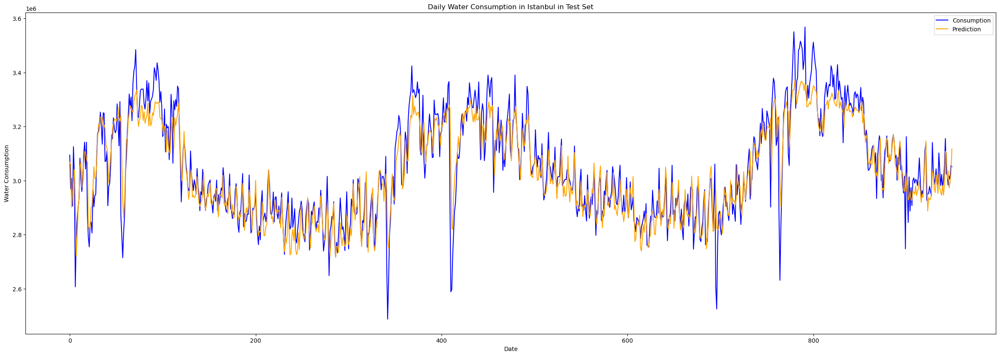

In [56]:
plt.figure(figsize=(30, 10))
plt.plot(range(len(actual_vol_test)), actual_vol_test, color='b', label='Consumption')
plt.plot(range(len(actual_vol_test)), pred_vol_test, color='orange', label='Prediction')
plt.title('Daily Water Consumption in Istanbul in Test Set')
plt.xlabel('Date')
plt.ylabel('Water Consumption')
plt.legend()
plt.show()

# Prescriptive Problem

Dividing the dataset

In [57]:
train_set = masterdf.loc["2011-01-01":"2020-12-31"]
test_set = masterdf.loc['2021-01-01':'2023-12-31']

y_train = train_set['consumption']
y_test = test_set['consumption']

X_train = train_set.drop(columns=['May'])
X_train = X_train.iloc[:,1:]
#removed May

X_test = test_set.drop(columns=['May'])
X_test = X_test.iloc[:,1:]

Applying our linear model reduced slightly with lasso to our prescriptive problem

In [58]:
n_train = len(y_train)                                                      # Number of months in training data
n_pred = len(X_train.columns)                                               # Number of predictors
c_u = 19
c_o = 1

model = Model("OPTIMIZATION")  
Z_pos = model.addVars(range(0,n_train), name="Underage", lb=0)              # define variable for Lowerage
Z_neg = model.addVars(range(0,n_train), name="Overage", lb=0)               # define variable for Upperage
q = model.addVars(range(0,n_pred), name="coed_pred", lb=float('-inf'), vtype=GRB.CONTINUOUS) # define variable for features
q_0 = model.addVar(name="coed_0", lb=float('-inf'), vtype=GRB.CONTINUOUS)    # define variable for q0

model.addConstrs((Z_pos[i] >= y_train.iloc[i] - (q_0 + quicksum(X_train.iloc[i][j] * q[j] for j in range(0,n_pred))) for i in range(0,n_train)), name='Underage Level')

model.addConstrs((Z_neg[i] >= (q_0 + quicksum(X_train.iloc[i][j] * q[j] for j in range(0,n_pred))) - y_train.iloc[i] for i in range(0,n_train)), name='Overage Level')


obj = (1/n_train) * quicksum(c_u * Z_pos[t] + c_o * Z_neg[t] for t in range(0,n_train))

model.setObjective(obj, GRB.MINIMIZE)

model.optimize()

for v in model.getVars():
    if v.X != 0:
        print("%s %f" % (v.Varname, v.X))

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-12
Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (win64 - Windows 11.0 (22631.2))

CPU model: AMD Ryzen 7 5800H with Radeon Graphics, instruction set [SSE2|AVX|AVX2]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 7306 rows, 7330 columns and 72932 nonzeros
Model fingerprint: 0x960431fa
Coefficient statistics:
  Matrix range     [1e-01, 2e+07]
  Objective range  [3e-04, 5e-03]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e+06, 3e+06]
Presolve time: 0.03s
Presolved: 24 rows, 3653 columns, 32813 nonzeros

Concurrent LP optimizer: primal simplex, dual simplex, and barrier
Showing barrier log only...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 2.160e+02
 Factor NZ  : 3.000e+02 (roughly 1 MB of memory)
 Factor Ops : 4.900e+03 (less than 1 second per iteration)
 Threads    : 1

                  Objective                Residual

Output of the training set

In [59]:
print("Optimal Objective Value on Training Set: ", model.objVal)
optimal_order_quantity = (
    f"Optimal Order Quantity: {q_0.X:.2f} + {q[0].X:.2f} * temp + {q[1].X:.2f} * rain + {q[2].X:.2f} * popul + {q[3].X:.2f} * YearTrend +\n"
    f"    {q[4].X:.2f} * Tuesday + {q[5].X:.2f} * 'Wednesday' + {q[6].X:.2f} * 'Thursday' + {q[7].X:.2f} * 'Friday' +\n"
    f"    {q[8].X:.2f} * 'Saturday' + {q[9].X:.2f} * 'Sunday' + {q[10].X:.2f} * 'February' + {q[11].X:.2f} * 'March' +\n"
    f"    {q[12].X:.2f} * 'April' + {q[13].X:.2f} * 'June' + {q[14].X:.2f} * 'July' + {q[15].X:.2f} * 'August' +\n"
    f"    {q[16].X:.2f} * 'September' + {q[17].X:.2f} * 'October' + {q[18].X:.2f} * 'November' + {q[19].X:.2f} * 'December' +\n"
    f"    {q[20].X:.2f} * 'lag_1' + {q[21].X:.2f} * 'lag_7' + {q[22].X:.2f} * 'lag_365'"
)

print(optimal_order_quantity)

Optimal Objective Value on Training Set:  127122.15019450258
Optimal Order Quantity: 512262.10 + 7069.22 * temp + -34556.37 * rain + 0.04 * popul + 26658.26 * YearTrend +
    -8886.25 * Tuesday + 11998.01 * 'Wednesday' + 24936.69 * 'Thursday' + 2384.30 * 'Friday' +
    24074.13 * 'Saturday' + 68721.63 * 'Sunday' + -39679.83 * 'February' + -41469.40 * 'March' +
    -52987.34 * 'April' + 37146.77 * 'June' + 27466.43 * 'July' + 15742.94 * 'August' +
    9287.96 * 'September' + -21845.45 * 'October' + -15248.57 * 'November' + 5112.59 * 'December' +
    0.48 * 'lag_1' + 0.02 * 'lag_7' + 0.02 * 'lag_365'


Test Set Performance for 95% Service Level

In [60]:
cost = 0
order_test = []
number_of_overage = 0
number_of_underage = 0

for i in range(len(y_test)):
    val = 0
    d_test = y_test[i]
    for j in range(n_pred):
        val = val + q[j].X * X_test.iloc[i,j]
    order_test.append(q_0.X + val)
    if d_test - order_test[i] >= 0:
        cost = cost + (d_test - order_test[i]) * c_u
        number_of_underage += 1
    else:
        cost = cost + (order_test[i] - d_test) * c_o
        number_of_overage += 1
        
print("Average backordering and holding Cost on Test Set: ", cost/len(y_test))
print("Number of times overage happened: ", number_of_overage)
print("Number of times underage happened: ", number_of_underage)
print(f"Percentage of meeting water consumption: % {(number_of_overage/(number_of_overage+number_of_underage))*100:.2f}")

Average backordering and holding Cost on Test Set:  153190.70734330913
Number of times overage happened:  1078
Number of times underage happened:  17
Percentage of meeting water consumption: % 98.45
